In [1]:
import torch
import torch.nn.functional as F
import torch.nn as nn
import torch.optim as optim
from torch.optim import SGD, Optimizer
import math
from tqdm import tqdm

In [2]:
# SAM
class SAM(Optimizer):
    def __init__(
            self, 
            params, 
            rho=0.05, 
            **kwargs,
        ):
        assert rho >= 0.0, f"Invalid rho, should be non-negative: {rho}"

        defaults = dict(rho=rho, **kwargs)
        super(SAM, self).__init__(params, defaults)

        self.base_optimizer = SGD(self.param_groups, **kwargs)
        self.param_groups = self.base_optimizer.param_groups
        self.defaults.update(self.base_optimizer.defaults)

    @torch.no_grad()
    def first_step(self, zero_grad=False):
        grad_norm = self._grad_norm()
        for group in self.param_groups:
            scale = group["rho"] / (grad_norm + 1e-12)

            for p in group["params"]:
                if p.grad is None: continue
                self.state[p]["old_p"] = p.data.clone()
                e_w = p.grad * scale.to(p)
                p.add_(e_w)  # climb to the local maximum "w + e(w)"

        if zero_grad: self.zero_grad()

    @torch.no_grad()
    def second_step(self, zero_grad=False):
        for group in self.param_groups:
            for p in group["params"]:
                if p.grad is None: continue
                p.data = self.state[p]["old_p"]  # get back to "w" from "w + e(w)"

        self.base_optimizer.step()  # do the actual "sharpness-aware" update

        if zero_grad: self.zero_grad()

    @torch.no_grad()
    def step(self, closure=None):
        assert closure is not None, "Sharpness Aware Minimization requires closure, but it was not provided"
        closure = torch.enable_grad()(closure)  # the closure should do a full forward-backward pass

        self.first_step(zero_grad=True)
        closure()
        self.second_step()

    def _grad_norm(self):
        shared_device = self.param_groups[0]["params"][0].device  # put everything on the same device, in case of model parallelism
        norm = torch.norm(
                    torch.stack([
                        (p.grad).norm(p=2).to(shared_device)
                        for group in self.param_groups for p in group["params"]
                        if p.grad is not None
                    ]),
                    p=2
               )
        return norm

In [3]:
# Random generators with random seeds
X_train_gen = torch.Generator()   
X_train_gen.manual_seed(1) 
X_test_gen = torch.Generator() 
Noise_gen = torch.Generator()
Noise_gen.manual_seed(5)
Sample_gen = torch.Generator()
Sample_gen.manual_seed(3)

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [5]:
# helper functions
def mse(X,Y):
    losses = (X-Y)**2
    return losses.mean()

def single_index(n, d, gen, device="cpu"):
    theta = torch.ones(d)
    theta[1:] = 0
    X =  torch.normal(mean=0, std=1, size=(n,d), device = device, requires_grad=False, generator=gen)
    Y = X @ theta
    return X, Y

def var(X):
    return torch.var(X)
    
def second_moment(X):
    return var(X) + (torch.mean(X)) ** 2

In [6]:
# Parameters
mode = "ntk"
d = 20        # input dimension
m = 1000      # neuron width
n = 200       # number of data

eta_1 = 1e-3   # learning rate for W
eta_2 = 1e-3   # learning rate for a 

label_noise = True  # whether to use label noise
B = 1                # batch size
k_sigma = 4 * d      # label noise scale
k_1 = 1/d * k_sigma  # +- constant
epoch_num = 100001   # number of steps
criterion = mse      # loss function

In [7]:
class TwoLayerNN(nn.Module):
    def __init__(self, d, m, scale="ntk"):
        super(TwoLayerNN, self).__init__()
        W1_gen = torch.Generator()
        W1_gen.manual_seed(99) 
        W2_gen = torch.Generator()
        W2_gen.manual_seed(101)

        # Initialize W (m,d)
        W = torch.randn(m, d, generator=W1_gen) 
        W = W / (d ** 0.5)
        
        self.W = nn.Parameter(W, requires_grad=True)

        # Initialize a~N(0,1) (m,1)
        # a = 2 * torch.randint(0, 2, (m, 1), generator=W2_gen) - 1
        a = torch.randn(m, 1, generator=W2_gen)
        a = a / (m ** 0.5)
          
        self.a = nn.Parameter(a, requires_grad=True)
        self.scale = scale
        self.m = m

    def forward(self, X): #X:(n,d) W:(m,d) a:(m,1)
        output = X @ self.W.T @ self.a # shape: (T, n, m)
        return output

In [8]:
# Generate training and test data
X_GD,Y_GD = single_index(n, d, X_train_gen, device=device)
X_test, Y_test = single_index(n,d,X_test_gen, device=device)
print(X_GD)
print(Y_GD[:10])
print(X_test)
print(Y_test[:10])

tensor([[-1.5256, -0.7502, -0.6540,  ..., -1.1608,  0.6995,  0.1991],
        [ 0.8657,  0.2444, -0.6629,  ...,  0.0457,  0.1530, -0.4757],
        [-0.1110,  0.2927, -0.1578,  ...,  0.9386, -0.1860, -0.6446],
        ...,
        [ 0.6381, -0.3540, -0.5431,  ...,  1.9151, -0.6811,  0.7034],
        [-0.8180, -0.4039, -1.2104,  ..., -1.0875, -0.2432, -0.0727],
        [ 0.0742,  0.5778, -1.0970,  ..., -1.1242,  0.9775,  0.7015]])
tensor([-1.5256,  0.8657, -0.1110,  1.5392, -0.5065,  1.3851,  2.5581,  2.2952,
         0.4175, -0.9640])
tensor([[-0.1737, -1.8225,  0.7792,  ..., -1.9745,  1.5358,  0.5033],
        [ 1.2364, -0.7147,  0.0041,  ..., -0.9549,  0.3995,  0.1250],
        [ 2.0879, -0.2450, -0.2927,  ...,  1.0148, -0.1364,  1.0802],
        ...,
        [-0.6677,  1.2787,  1.1509,  ..., -0.4065,  0.4354, -0.6589],
        [-0.1866, -1.1444, -1.3670,  ...,  0.4300, -2.3673,  0.1478],
        [ 0.5755, -0.4983, -0.9520,  ...,  0.9588, -0.6980, -0.3095]])
tensor([-0.1737,  1.2364,

In [9]:
# Create model
torch.cuda.empty_cache()
model = TwoLayerNN(d, m,scale=mode).to(device)

W1_list = []
W2_list = []

losses = []
total_losses = []
test_losses = []
indexes_large_loss = []

check_num = 248
check_pos = [i * (epoch_num // check_num) for i in range(check_num)]
check_idx = 0

print(check_pos)
print(model.a)

[0, 403, 806, 1209, 1612, 2015, 2418, 2821, 3224, 3627, 4030, 4433, 4836, 5239, 5642, 6045, 6448, 6851, 7254, 7657, 8060, 8463, 8866, 9269, 9672, 10075, 10478, 10881, 11284, 11687, 12090, 12493, 12896, 13299, 13702, 14105, 14508, 14911, 15314, 15717, 16120, 16523, 16926, 17329, 17732, 18135, 18538, 18941, 19344, 19747, 20150, 20553, 20956, 21359, 21762, 22165, 22568, 22971, 23374, 23777, 24180, 24583, 24986, 25389, 25792, 26195, 26598, 27001, 27404, 27807, 28210, 28613, 29016, 29419, 29822, 30225, 30628, 31031, 31434, 31837, 32240, 32643, 33046, 33449, 33852, 34255, 34658, 35061, 35464, 35867, 36270, 36673, 37076, 37479, 37882, 38285, 38688, 39091, 39494, 39897, 40300, 40703, 41106, 41509, 41912, 42315, 42718, 43121, 43524, 43927, 44330, 44733, 45136, 45539, 45942, 46345, 46748, 47151, 47554, 47957, 48360, 48763, 49166, 49569, 49972, 50375, 50778, 51181, 51584, 51987, 52390, 52793, 53196, 53599, 54002, 54405, 54808, 55211, 55614, 56017, 56420, 56823, 57226, 57629, 58032, 58435, 58838, 

In [10]:
Spec_neuron_check_num = 3
W1_check_pos = [i * 299 for i in range(Spec_neuron_check_num)]
W2_check_pos = [i * 299 for i in range(Spec_neuron_check_num)]

Spec_neuron_check_num += 2
W1_check_pos.append(224)
W1_check_pos.append(397)
W2_check_pos.append(224)
W2_check_pos.append(397)

W1_spec_norm = []
W1_spec_cossim = []
W2_check_list = []
for i in range(Spec_neuron_check_num):
     W1_spec_norm.append([])
     W1_spec_cossim.append([])
     W2_check_list.append([])

In [11]:
# initial value

W1_list.append(model.W.detach().clone())
W2_list.append(model.a.detach().clone())

In [12]:
# find the hign and low alignment neuron

high_value = 0.6
low_value = 0.01
count_1 = 0
count_2 = 0 
for i in range(m):
     # find the high alignment
     if abs(W1_list[0][i][0].item() / W1_list[0][i].norm().item()) > high_value and count_1 <= 2:
          Spec_neuron_check_num += 1
          count_1 += 1
          W1_check_pos.append(i)
          W2_check_pos.append(i)
          W1_spec_norm.append([])
          W1_spec_cossim.append([])
          W2_check_list.append([])
          print(i, W1_list[0][i][0].item() / W1_list[0][i].norm().item())

     # find the low alignment
     if abs(W1_list[0][i][0].item() / W1_list[0][i].norm().item()) < low_value and count_2 <= 2:
          count_2 += 1
          Spec_neuron_check_num += 1
          W1_check_pos.append(i)
          W2_check_pos.append(i)
          W1_spec_norm.append([])
          W1_spec_cossim.append([])
          W2_check_list.append([])
          print(i, W1_list[0][i][0].item() / W1_list[0][i].norm().item())

22 -0.002134498187899788
29 0.6000853499730193
47 0.7044816434854845
53 0.00406994566865859
83 -0.008769859984037584
172 0.6046099551697279


In [13]:
for i in range(Spec_neuron_check_num):
     W1_spec_norm[i].append(W1_list[0][W1_check_pos[i]].norm().item())
     W2_check_list[i].append(W2_list[0][W2_check_pos[i]].norm().item())
     W1_spec_cossim[i].append(W1_list[0][W1_check_pos[i]][0].item() / W1_list[0][W1_check_pos[i]].norm().item())
     
check_idx += 1
print(W1_spec_norm)
print(W1_spec_cossim)
print(W2_check_list)

[[1.3369513750076294], [1.0153546333312988], [1.1327077150344849], [1.0816752910614014], [1.1265087127685547], [1.033682107925415], [0.781599760055542], [1.126628041267395], [0.9336130023002625], [0.708724856376648], [0.9275426268577576]]
[[0.050085242869005626], [-0.28774544427344834], [-0.40970612958057284], [0.40667565780410525], [-0.11160908544483293], [-0.002134498187899788], [0.6000853499730193], [0.7044816434854845], [0.00406994566865859], [-0.008769859984037584], [0.6046099551697279]]
[[0.019061025232076645], [0.007555644493550062], [0.01030791737139225], [0.03322988376021385], [0.0009467768250033259], [0.017645273357629776], [0.030422911047935486], [0.017395110800862312], [0.028857743367552757], [0.05297310650348663], [0.02283947914838791]]


In [14]:
W1_norm_means = []
W2_norm_means = []
Cos_sim_abs_means = []
W2_W1_norm_means = []
W2_vari_abs_means = []
W2_vari_norms = []
W2_pre = torch.zeros(m).unsqueeze(1)

In [15]:
optimizer = SAM([{'params': model.W, 'lr': eta_1},{'params': model.a, 'lr': eta_2}])

for i in tqdm(range(epoch_num)):
     model.zero_grad()
     with torch.no_grad():
          if check_idx < check_num and check_pos[check_idx] == i:
               W1_temp = model.W.detach().clone()
               W2_temp = model.a.detach().clone()
               W1_list.append(W1_temp)
               W2_list.append(W2_temp)
               print(W1_temp.shape)
               print(W2_temp.shape)
               check_idx += 1

     indices = torch.randperm(n, generator = Sample_gen)[:B]
     X = X_GD[indices,:]
     Y = Y_GD[indices]

     N = 2 * torch.randint(0, 2, (B,1), generator = Noise_gen).squeeze() - 1

     if(label_noise):
          Y_noisy = Y + k_1 * N
     else:
          Y_noisy = Y
     
     output = model(X).squeeze()
     loss = criterion(output,Y_noisy)
     
     Y_tmp = model(X_GD).squeeze()
     Y_tmp_test = model(X_test).squeeze()

     with torch.no_grad():
          losses.append(loss.item())
          total_losses.append(criterion(Y_tmp, Y_GD).item())
          test_losses.append(criterion(Y_tmp_test, Y_test).item())
          if loss.item() > 1:
               indexes_large_loss.append(i)

          W1_temp = model.W.detach().clone()
          W2_temp = model.a.detach().clone()

          # compute the mean
          W1_norms = torch.norm(W1_temp, dim=1)
          mean_norm = W1_norms.mean().item() 
          W1_norm_means.append(mean_norm)

          W2_norms = torch.norm(W2_temp, dim=1)
          mean_norm = W2_norms.mean().item() 
          W2_norm_means.append(mean_norm)

          r1 = torch.abs(W1_temp[:, :1] / W1_norms.unsqueeze(1))  # theta = [1,0,0,...,0]
          r1_mean = r1.mean().item()
          Cos_sim_abs_means.append(r1_mean)

          r2 = W1_norms * W2_norms
          r2_mean = r2.mean().item()
          W2_W1_norm_means.append(r2_mean)

          r3 = torch.abs(W2_temp - W2_pre)
          r3_mean = r3.mean().item()
          W2_vari_abs_means.append(r3_mean)

          r4 = torch.norm(W2_temp - W2_pre)
          W2_vari_norms.append(r4.item())
          
          W2_pre = W2_temp

          for j in range(Spec_neuron_check_num):
               W2_check_list[j].append(W2_temp[W2_check_pos[j]].item())
               W1_spec_norm[j].append(W1_temp[W1_check_pos[j]].norm().item())
               W1_spec_cossim[j].append(W1_temp[W1_check_pos[j]][0].item() / W1_temp[W1_check_pos[j]].norm().item())

               
     loss.backward()
     optimizer.first_step(zero_grad = True)
     (criterion(model(X),Y_noisy)).backward()
     optimizer.second_step(zero_grad = True)

     if(i % 1000 == 0):
          with torch.no_grad():
               print(Y_tmp.shape, Y_GD.shape)
               print("loss:",criterion(model(X),Y))
               print("total_loss:",criterion(Y_tmp, Y_GD))
               print(Y_tmp_test.shape,Y_test.shape)
               print("test_loss:",criterion(Y_tmp_test, Y_test))
model.zero_grad()

  0%|          | 67/100001 [00:00<04:55, 338.09it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(59.0437)
total_loss: tensor(1.2010)
torch.Size([200]) torch.Size([200])
test_loss: tensor(1.2349)


  0%|          | 438/100001 [00:02<09:50, 168.71it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


  1%|          | 840/100001 [00:03<05:20, 309.55it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


  1%|          | 1055/100001 [00:04<05:42, 289.28it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(22.4929)
total_loss: tensor(21.6628)
torch.Size([200]) torch.Size([200])
test_loss: tensor(21.2771)


  1%|          | 1241/100001 [00:04<07:35, 216.59it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


  2%|▏         | 1652/100001 [00:06<06:24, 255.83it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


  2%|▏         | 2044/100001 [00:07<04:49, 338.61it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(11.4392)
total_loss: tensor(11.1558)
torch.Size([200]) torch.Size([200])
test_loss: tensor(11.7537)
torch.Size([1000, 20])
torch.Size([1000, 1])


  2%|▏         | 2462/100001 [00:08<04:12, 386.69it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


  3%|▎         | 2894/100001 [00:10<04:26, 364.14it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


  3%|▎         | 3050/100001 [00:10<04:16, 377.29it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(10.9732)
total_loss: tensor(9.7052)
torch.Size([200]) torch.Size([200])
test_loss: tensor(10.1947)


  3%|▎         | 3247/100001 [00:11<04:24, 365.88it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


  4%|▎         | 3711/100001 [00:12<04:15, 376.51it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


  4%|▍         | 4064/100001 [00:13<04:28, 357.97it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(6.8722)
total_loss: tensor(5.4479)
torch.Size([200]) torch.Size([200])
test_loss: tensor(6.8125)
torch.Size([1000, 20])
torch.Size([1000, 1])


  4%|▍         | 4464/100001 [00:14<05:32, 287.00it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


  5%|▍         | 4901/100001 [00:15<04:14, 373.00it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


  5%|▌         | 5054/100001 [00:16<04:16, 370.22it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(2.4794)
total_loss: tensor(6.1351)
torch.Size([200]) torch.Size([200])
test_loss: tensor(10.5147)


  5%|▌         | 5279/100001 [00:17<04:42, 335.22it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


  6%|▌         | 5638/100001 [00:18<04:36, 340.98it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


  6%|▌         | 6015/100001 [00:23<17:46, 88.12it/s] 

torch.Size([200]) torch.Size([200])
loss: tensor(0.1766)
total_loss: tensor(7.5172)
torch.Size([200]) torch.Size([200])
test_loss: tensor(8.2520)


  6%|▌         | 6084/100001 [00:23<09:53, 158.22it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


  6%|▋         | 6486/100001 [00:24<04:48, 324.64it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


  7%|▋         | 6911/100001 [00:26<04:30, 343.81it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


  7%|▋         | 7051/100001 [00:26<04:34, 338.89it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(1.6465)
total_loss: tensor(2.8585)
torch.Size([200]) torch.Size([200])
test_loss: tensor(2.8438)


  7%|▋         | 7303/100001 [00:27<04:17, 359.46it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


  8%|▊         | 7714/100001 [00:28<04:16, 359.72it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


  8%|▊         | 8067/100001 [00:29<04:38, 330.47it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(0.1039)
total_loss: tensor(1.6123)
torch.Size([200]) torch.Size([200])
test_loss: tensor(1.8114)
torch.Size([1000, 20])
torch.Size([1000, 1])


  9%|▊         | 8504/100001 [00:30<04:13, 360.45it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


  9%|▉         | 8904/100001 [00:32<05:02, 301.22it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


  9%|▉         | 9035/100001 [00:32<04:55, 307.70it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(1.9618)
total_loss: tensor(2.4528)
torch.Size([200]) torch.Size([200])
test_loss: tensor(2.9422)


  9%|▉         | 9312/100001 [00:33<04:42, 320.80it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 10%|▉         | 9736/100001 [00:34<04:16, 351.56it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 10%|█         | 10077/100001 [00:35<04:25, 338.16it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(2.6611)
total_loss: tensor(2.4532)
torch.Size([200]) torch.Size([200])
test_loss: tensor(2.4572)
torch.Size([1000, 20])
torch.Size([1000, 1])


 11%|█         | 10510/100001 [00:36<04:07, 360.90it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 11%|█         | 10932/100001 [00:38<04:42, 314.78it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 11%|█         | 11019/100001 [00:38<07:05, 209.16it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(0.5859)
total_loss: tensor(1.4488)
torch.Size([200]) torch.Size([200])
test_loss: tensor(1.9361)


 11%|█▏        | 11300/100001 [00:39<03:49, 387.01it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 12%|█▏        | 11717/100001 [00:43<05:39, 260.21it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 12%|█▏        | 12049/100001 [00:45<05:18, 275.79it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(2.7006)
total_loss: tensor(2.8340)
torch.Size([200]) torch.Size([200])
test_loss: tensor(2.9719)


 12%|█▏        | 12132/100001 [00:45<05:48, 252.33it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 13%|█▎        | 12546/100001 [00:46<05:18, 274.73it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 13%|█▎        | 12934/100001 [00:48<05:51, 247.87it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 13%|█▎        | 13049/100001 [00:48<05:17, 273.82it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(0.8672)
total_loss: tensor(2.6460)
torch.Size([200]) torch.Size([200])
test_loss: tensor(3.5541)


 13%|█▎        | 13326/100001 [00:50<06:24, 225.23it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 14%|█▎        | 13736/100001 [00:51<05:52, 244.61it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 14%|█▍        | 14041/100001 [00:52<05:17, 270.99it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(2.9222)
total_loss: tensor(1.1811)
torch.Size([200]) torch.Size([200])
test_loss: tensor(1.3212)


 14%|█▍        | 14153/100001 [00:53<05:22, 266.37it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 15%|█▍        | 14540/100001 [00:54<05:32, 257.38it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 15%|█▍        | 14936/100001 [00:56<05:07, 276.22it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 15%|█▌        | 15048/100001 [00:57<05:33, 254.43it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(0.3380)
total_loss: tensor(0.4390)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.4527)


 15%|█▌        | 15365/100001 [00:58<05:12, 270.77it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 16%|█▌        | 15773/100001 [00:59<04:37, 303.37it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 16%|█▌        | 16052/100001 [01:00<03:59, 350.15it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(0.0973)
total_loss: tensor(1.1809)
torch.Size([200]) torch.Size([200])
test_loss: tensor(1.4835)


 16%|█▌        | 16166/100001 [01:00<03:48, 366.53it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 17%|█▋        | 16576/100001 [01:01<03:43, 373.22it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 17%|█▋        | 16990/100001 [01:03<03:54, 354.66it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])
torch.Size([200]) torch.Size([200])
loss: tensor(0.0079)
total_loss: tensor(0.7435)
torch.Size([200]) torch.Size([200])
test_loss: tensor(1.0378)


 17%|█▋        | 17369/100001 [01:04<03:45, 366.13it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 18%|█▊        | 17787/100001 [01:05<04:29, 305.28it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 18%|█▊        | 18071/100001 [01:06<03:51, 353.29it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(0.4482)
total_loss: tensor(0.5261)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.7784)


 18%|█▊        | 18178/100001 [01:06<04:00, 339.81it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 19%|█▊        | 18591/100001 [01:07<04:09, 326.62it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 19%|█▉        | 18980/100001 [01:09<04:31, 298.04it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 19%|█▉        | 19041/100001 [01:09<04:36, 293.04it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(0.0007)
total_loss: tensor(0.5843)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.7839)


 19%|█▉        | 19400/100001 [01:10<04:24, 305.16it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 20%|█▉        | 19774/100001 [01:11<04:07, 324.23it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 20%|██        | 20060/100001 [01:12<03:57, 337.08it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(0.1887)
total_loss: tensor(0.2684)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.2027)


 20%|██        | 20206/100001 [01:13<03:41, 359.46it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 21%|██        | 20625/100001 [01:14<03:30, 376.34it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 21%|██        | 21013/100001 [01:15<03:37, 363.97it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])
torch.Size([200]) torch.Size([200])
loss: tensor(0.3183)
total_loss: tensor(0.4300)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.5065)


 21%|██▏       | 21423/100001 [01:16<03:33, 368.28it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 22%|██▏       | 21807/100001 [01:17<03:27, 376.37it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 22%|██▏       | 22037/100001 [01:18<03:33, 365.14it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(0.2900)
total_loss: tensor(0.4546)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.6011)


 22%|██▏       | 22191/100001 [01:18<03:25, 377.86it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 23%|██▎       | 22604/100001 [01:19<03:27, 372.66it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 23%|██▎       | 22990/100001 [01:20<03:48, 336.48it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])
torch.Size([200]) torch.Size([200])
loss: tensor(0.0245)
total_loss: tensor(0.2598)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.2575)


 23%|██▎       | 23431/100001 [01:22<03:19, 384.75it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 24%|██▍       | 23843/100001 [01:23<03:29, 363.54it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 24%|██▍       | 24067/100001 [01:23<03:32, 358.15it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(1.1331)
total_loss: tensor(0.2561)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.3631)


 24%|██▍       | 24249/100001 [01:24<03:39, 344.67it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 25%|██▍       | 24627/100001 [01:25<03:29, 359.85it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 25%|██▌       | 25041/100001 [01:26<03:27, 360.71it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])
torch.Size([200]) torch.Size([200])
loss: tensor(0.2207)
total_loss: tensor(0.1025)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.1192)


 25%|██▌       | 25456/100001 [01:27<03:22, 368.58it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 26%|██▌       | 25836/100001 [01:28<03:19, 370.83it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 26%|██▌       | 26088/100001 [01:29<03:04, 400.10it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(0.8995)
total_loss: tensor(0.1475)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.1720)


 26%|██▌       | 26235/100001 [01:30<04:01, 306.04it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 27%|██▋       | 26648/100001 [01:31<03:20, 365.21it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 27%|██▋       | 27063/100001 [01:32<03:18, 367.13it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(0.0255)
total_loss: tensor(0.2043)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.2408)
torch.Size([1000, 20])
torch.Size([1000, 1])


 27%|██▋       | 27473/100001 [01:33<03:29, 345.43it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 28%|██▊       | 27853/100001 [01:34<03:13, 372.69it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 28%|██▊       | 28043/100001 [01:35<03:19, 360.10it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(0.2068)
total_loss: tensor(0.5948)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.5774)


 28%|██▊       | 28268/100001 [01:35<03:20, 358.52it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 29%|██▊       | 28666/100001 [01:36<03:15, 365.33it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 29%|██▉       | 29052/100001 [01:37<03:06, 380.33it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(0.0327)
total_loss: tensor(0.1142)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.1112)
torch.Size([1000, 20])
torch.Size([1000, 1])


 29%|██▉       | 29451/100001 [01:39<03:52, 302.81it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 30%|██▉       | 29892/100001 [01:40<03:13, 361.84it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 30%|███       | 30040/100001 [01:40<03:14, 359.51it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(0.1791)
total_loss: tensor(0.0575)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.0614)


 30%|███       | 30294/100001 [01:41<03:18, 350.95it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 31%|███       | 30659/100001 [01:42<03:20, 345.24it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 31%|███       | 31072/100001 [01:43<03:06, 369.37it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(0.0822)
total_loss: tensor(0.1036)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.0982)
torch.Size([1000, 20])
torch.Size([1000, 1])


 31%|███▏      | 31496/100001 [01:45<03:01, 377.88it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 32%|███▏      | 31908/100001 [01:46<03:04, 368.72it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 32%|███▏      | 32057/100001 [01:46<03:10, 356.86it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(0.0036)
total_loss: tensor(0.1358)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.1352)


 32%|███▏      | 32318/100001 [01:47<03:05, 364.57it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 33%|███▎      | 32697/100001 [01:48<03:17, 340.89it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 33%|███▎      | 33064/100001 [01:49<03:02, 366.91it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(1.6451)
total_loss: tensor(0.3701)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.3301)
torch.Size([1000, 20])
torch.Size([1000, 1])


 33%|███▎      | 33484/100001 [01:50<03:00, 368.60it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 34%|███▍      | 33896/100001 [01:51<03:03, 360.93it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 34%|███▍      | 34044/100001 [01:52<03:37, 303.61it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(0.0051)
total_loss: tensor(0.0523)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.0576)


 34%|███▍      | 34290/100001 [01:53<03:13, 339.28it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 35%|███▍      | 34702/100001 [01:54<02:51, 380.31it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 35%|███▌      | 35080/100001 [01:55<02:54, 373.00it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(0.0016)
total_loss: tensor(0.0944)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.0801)
torch.Size([1000, 20])
torch.Size([1000, 1])


 36%|███▌      | 35519/100001 [01:56<02:55, 367.73it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 36%|███▌      | 35898/100001 [01:57<03:08, 339.50it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 36%|███▌      | 36045/100001 [01:58<02:57, 359.74it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(0.0761)
total_loss: tensor(0.1991)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.1892)


 36%|███▋      | 36344/100001 [01:58<02:54, 365.29it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 37%|███▋      | 36720/100001 [01:59<02:52, 366.52it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 37%|███▋      | 37042/100001 [02:01<03:24, 308.50it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(0.0176)
total_loss: tensor(0.3826)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.3558)


 37%|███▋      | 37107/100001 [02:01<03:26, 304.38it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 38%|███▊      | 37557/100001 [02:02<02:43, 381.25it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 38%|███▊      | 37928/100001 [02:03<03:08, 329.11it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 38%|███▊      | 38070/100001 [02:04<02:58, 347.36it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(0.0244)
total_loss: tensor(0.0731)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.0692)


 38%|███▊      | 38362/100001 [02:04<02:53, 354.98it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 39%|███▊      | 38740/100001 [02:05<02:46, 366.99it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 39%|███▉      | 39074/100001 [02:06<02:53, 351.81it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(0.2583)
total_loss: tensor(0.3135)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.2773)


 39%|███▉      | 39145/100001 [02:07<02:58, 340.71it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 40%|███▉      | 39559/100001 [02:08<02:42, 371.66it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 40%|███▉      | 39970/100001 [02:09<02:49, 354.22it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 40%|████      | 40036/100001 [02:09<03:42, 269.30it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(0.5331)
total_loss: tensor(0.5624)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.5035)


 40%|████      | 40367/100001 [02:10<02:40, 371.05it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 41%|████      | 40748/100001 [02:11<02:40, 369.08it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 41%|████      | 41049/100001 [02:12<02:45, 357.26it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(0.7566)
total_loss: tensor(0.2140)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.1834)


 41%|████      | 41154/100001 [02:12<03:11, 307.07it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 42%|████▏     | 41565/100001 [02:14<02:35, 375.18it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 42%|████▏     | 41951/100001 [02:15<02:34, 376.10it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 42%|████▏     | 42066/100001 [02:15<02:46, 347.27it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(0.1194)
total_loss: tensor(0.3234)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.2803)


 42%|████▏     | 42354/100001 [02:16<02:44, 350.41it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 43%|████▎     | 42772/100001 [02:17<02:32, 374.92it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 43%|████▎     | 43078/100001 [02:18<02:32, 374.28it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(0.0059)
total_loss: tensor(0.1051)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.0976)


 43%|████▎     | 43154/100001 [02:18<02:36, 362.56it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 44%|████▎     | 43565/100001 [02:19<02:34, 365.91it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 44%|████▍     | 43977/100001 [02:21<02:34, 363.23it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 44%|████▍     | 44049/100001 [02:21<02:44, 339.97it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(0.0010)
total_loss: tensor(0.1181)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.1140)


 44%|████▍     | 44362/100001 [02:22<02:48, 330.01it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 45%|████▍     | 44800/100001 [02:23<02:29, 368.58it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 45%|████▌     | 45062/100001 [02:24<02:34, 355.82it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(0.1853)
total_loss: tensor(0.2002)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.1628)


 45%|████▌     | 45172/100001 [02:24<02:32, 358.88it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 46%|████▌     | 45577/100001 [02:25<02:24, 376.23it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 46%|████▌     | 45980/100001 [02:27<02:32, 353.19it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])
torch.Size([200]) torch.Size([200])
loss: tensor(0.0031)
total_loss: tensor(0.5639)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.5234)


 46%|████▋     | 46394/100001 [02:28<02:27, 363.10it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 47%|████▋     | 46802/100001 [02:29<02:33, 346.44it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 47%|████▋     | 47063/100001 [02:30<03:00, 292.77it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(8.9473e-05)
total_loss: tensor(0.1839)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.2013)


 47%|████▋     | 47202/100001 [02:30<02:36, 336.97it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 48%|████▊     | 47613/100001 [02:31<02:15, 386.88it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 48%|████▊     | 47995/100001 [02:32<02:25, 356.45it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])
torch.Size([200]) torch.Size([200])
loss: tensor(0.0699)
total_loss: tensor(0.0587)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.0601)


 48%|████▊     | 48412/100001 [02:34<02:25, 355.06it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 49%|████▉     | 48830/100001 [02:35<02:16, 375.84it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 49%|████▉     | 49060/100001 [02:35<02:16, 372.13it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(0.2646)
total_loss: tensor(0.2955)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.2694)


 49%|████▉     | 49211/100001 [02:36<02:18, 367.16it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 50%|████▉     | 49629/100001 [02:37<02:13, 376.82it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 50%|█████     | 50011/100001 [02:38<02:16, 366.10it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])
torch.Size([200]) torch.Size([200])
loss: tensor(0.0300)
total_loss: tensor(0.3278)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.3032)


 50%|█████     | 50431/100001 [02:39<02:09, 382.27it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 51%|█████     | 50828/100001 [02:41<02:24, 340.73it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 51%|█████     | 51049/100001 [02:41<02:18, 352.82it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(2.3857)
total_loss: tensor(0.4527)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.4201)


 51%|█████     | 51230/100001 [02:42<02:19, 348.75it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 52%|█████▏    | 51639/100001 [02:43<02:16, 353.37it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 52%|█████▏    | 52032/100001 [02:44<02:30, 318.61it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])
torch.Size([200]) torch.Size([200])
loss: tensor(0.2016)
total_loss: tensor(0.3451)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.3178)


 52%|█████▏    | 52440/100001 [02:45<02:06, 376.25it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 53%|█████▎    | 52854/100001 [02:47<02:07, 369.48it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 53%|█████▎    | 53040/100001 [02:47<02:24, 325.37it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(0.0308)
total_loss: tensor(0.0949)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.0856)


 53%|█████▎    | 53259/100001 [02:48<02:13, 349.24it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 54%|█████▎    | 53674/100001 [02:49<02:11, 351.89it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 54%|█████▍    | 54054/100001 [02:50<02:03, 370.74it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(0.0414)
total_loss: tensor(0.1333)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.0986)
torch.Size([1000, 20])
torch.Size([1000, 1])


 54%|█████▍    | 54472/100001 [02:51<02:03, 368.45it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 55%|█████▍    | 54850/100001 [02:52<02:05, 360.35it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 55%|█████▌    | 55033/100001 [02:53<02:15, 331.46it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(0.0010)
total_loss: tensor(0.2039)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.1537)


 55%|█████▌    | 55245/100001 [02:53<02:13, 334.35it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 56%|█████▌    | 55659/100001 [02:55<02:01, 364.33it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 56%|█████▌    | 56069/100001 [02:56<01:58, 370.71it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(0.1881)
total_loss: tensor(0.1231)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.0930)
torch.Size([1000, 20])
torch.Size([1000, 1])


 56%|█████▋    | 56479/100001 [02:57<02:00, 362.41it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 57%|█████▋    | 56905/100001 [02:58<01:53, 381.01it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 57%|█████▋    | 57056/100001 [02:59<01:58, 361.07it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(0.2546)
total_loss: tensor(0.5992)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.5214)


 57%|█████▋    | 57284/100001 [02:59<01:57, 363.38it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 58%|█████▊    | 57699/100001 [03:00<01:52, 375.89it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 58%|█████▊    | 58076/100001 [03:01<01:51, 375.40it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(0.2827)
total_loss: tensor(0.3274)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.2771)
torch.Size([1000, 20])
torch.Size([1000, 1])


 58%|█████▊    | 58498/100001 [03:03<01:47, 387.63it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 59%|█████▉    | 58874/100001 [03:04<02:03, 332.90it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 59%|█████▉    | 59059/100001 [03:04<01:53, 361.85it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(0.8077)
total_loss: tensor(0.3841)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.3484)


 59%|█████▉    | 59280/100001 [03:05<01:56, 350.11it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 60%|█████▉    | 59697/100001 [03:06<01:54, 351.54it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 60%|██████    | 60036/100001 [03:07<02:03, 324.46it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(0.3345)
total_loss: tensor(0.2683)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.2430)
torch.Size([1000, 20])
torch.Size([1000, 1])


 61%|██████    | 60525/100001 [03:09<01:48, 363.38it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 61%|██████    | 60900/100001 [03:10<01:50, 353.95it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 61%|██████    | 61047/100001 [03:10<01:57, 331.56it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(0.0109)
total_loss: tensor(0.0523)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.0650)


 61%|██████▏   | 61306/100001 [03:11<01:46, 361.78it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 62%|██████▏   | 61722/100001 [03:12<01:43, 371.23it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 62%|██████▏   | 62043/100001 [03:13<02:21, 267.88it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(0.0149)
total_loss: tensor(0.1978)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.2037)
torch.Size([1000, 20])
torch.Size([1000, 1])


 63%|██████▎   | 62522/100001 [03:14<01:45, 356.55it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 63%|██████▎   | 62901/100001 [03:16<01:58, 312.92it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 63%|██████▎   | 63033/100001 [03:16<02:19, 265.62it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(0.9165)
total_loss: tensor(0.3225)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.3098)


 63%|██████▎   | 63337/100001 [03:17<01:44, 350.97it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 64%|██████▎   | 63718/100001 [03:18<01:37, 373.04it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 64%|██████▍   | 64052/100001 [03:19<01:47, 333.56it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(0.1752)
total_loss: tensor(0.7116)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.6594)


 64%|██████▍   | 64124/100001 [03:19<01:43, 345.15it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 65%|██████▍   | 64537/100001 [03:20<01:34, 376.93it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 65%|██████▍   | 64959/100001 [03:22<01:41, 345.51it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 65%|██████▌   | 65030/100001 [03:22<01:43, 338.52it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(0.6027)
total_loss: tensor(0.6285)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.5792)


 65%|██████▌   | 65323/100001 [03:23<01:34, 365.88it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 66%|██████▌   | 65746/100001 [03:24<01:32, 372.22it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 66%|██████▌   | 66050/100001 [03:25<01:43, 327.41it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(0.0559)
total_loss: tensor(0.3080)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.2891)


 66%|██████▌   | 66124/100001 [03:25<01:55, 292.85it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 67%|██████▋   | 66552/100001 [03:26<01:35, 351.14it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 67%|██████▋   | 66938/100001 [03:27<01:27, 378.77it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 67%|██████▋   | 67047/100001 [03:28<01:42, 320.90it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(0.3527)
total_loss: tensor(0.2439)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.2428)


 67%|██████▋   | 67331/100001 [03:29<01:36, 339.61it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 68%|██████▊   | 67748/100001 [03:30<01:26, 371.02it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 68%|██████▊   | 68050/100001 [03:31<01:28, 360.00it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(5.2148)
total_loss: tensor(0.8932)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.8203)


 68%|██████▊   | 68159/100001 [03:31<01:31, 349.80it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 69%|██████▊   | 68587/100001 [03:32<01:23, 374.89it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 69%|██████▉   | 68973/100001 [03:33<01:32, 334.79it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 69%|██████▉   | 69042/100001 [03:34<01:35, 323.25it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(0.0203)
total_loss: tensor(0.1263)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.1317)


 69%|██████▉   | 69366/100001 [03:34<01:30, 340.19it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 70%|██████▉   | 69755/100001 [03:36<01:18, 385.30it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 70%|███████   | 70065/100001 [03:36<01:21, 365.79it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(0.1627)
total_loss: tensor(0.2782)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.2666)


 70%|███████   | 70179/100001 [03:37<01:24, 354.58it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 71%|███████   | 70591/100001 [03:38<01:19, 369.55it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 71%|███████   | 70963/100001 [03:39<01:22, 352.31it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 71%|███████   | 71034/100001 [03:39<01:27, 330.05it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(0.0065)
total_loss: tensor(0.5409)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.4890)


 71%|███████▏  | 71369/100001 [03:40<01:19, 361.71it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 72%|███████▏  | 71775/100001 [03:41<01:17, 365.66it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 72%|███████▏  | 72069/100001 [03:42<01:17, 362.63it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(0.0996)
total_loss: tensor(0.3194)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.2885)


 72%|███████▏  | 72178/100001 [03:43<01:22, 336.80it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 73%|███████▎  | 72588/100001 [03:44<01:17, 353.89it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 73%|███████▎  | 73023/100001 [03:45<01:11, 379.60it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])
torch.Size([200]) torch.Size([200])
loss: tensor(0.1268)
total_loss: tensor(0.1958)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.1708)


 73%|███████▎  | 73393/100001 [03:46<01:13, 362.84it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 74%|███████▍  | 73805/100001 [03:47<01:10, 369.78it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 74%|███████▍  | 74066/100001 [03:48<01:12, 357.24it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(0.0270)
total_loss: tensor(0.0781)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.0763)


 74%|███████▍  | 74207/100001 [03:48<01:22, 312.22it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 75%|███████▍  | 74581/100001 [03:50<01:15, 334.57it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 75%|███████▌  | 75018/100001 [03:51<01:06, 375.81it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])
torch.Size([200]) torch.Size([200])
loss: tensor(0.2229)
total_loss: tensor(0.1740)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.1688)


 75%|███████▌  | 75400/100001 [03:52<01:08, 359.41it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 76%|███████▌  | 75837/100001 [03:53<01:07, 357.72it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 76%|███████▌  | 76052/100001 [03:54<01:07, 352.47it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(1.1657)
total_loss: tensor(0.4062)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.3617)


 76%|███████▌  | 76232/100001 [03:54<01:13, 324.16it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 77%|███████▋  | 76608/100001 [03:55<01:03, 371.28it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 77%|███████▋  | 77034/100001 [03:57<00:59, 387.78it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])
torch.Size([200]) torch.Size([200])
loss: tensor(0.1033)
total_loss: tensor(0.2119)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.1785)


 77%|███████▋  | 77449/100001 [03:58<01:03, 355.53it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 78%|███████▊  | 77826/100001 [03:59<01:02, 355.68it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 78%|███████▊  | 78046/100001 [03:59<01:01, 358.01it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(0.1688)
total_loss: tensor(0.5060)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.4517)


 78%|███████▊  | 78234/100001 [04:00<00:58, 371.97it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 79%|███████▊  | 78637/100001 [04:01<01:05, 327.29it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 79%|███████▉  | 79037/100001 [04:02<01:00, 344.02it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])
torch.Size([200]) torch.Size([200])
loss: tensor(0.5335)
total_loss: tensor(0.3319)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.2748)


 79%|███████▉  | 79452/100001 [04:04<00:56, 365.35it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 80%|███████▉  | 79833/100001 [04:05<01:00, 334.08it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 80%|████████  | 80066/100001 [04:05<00:53, 373.15it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(0.0089)
total_loss: tensor(0.1628)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.1242)


 80%|████████  | 80258/100001 [04:06<00:53, 370.12it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 81%|████████  | 80649/100001 [04:07<00:52, 372.09it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 81%|████████  | 81076/100001 [04:08<00:51, 366.43it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(0.0017)
total_loss: tensor(0.2147)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.1783)
torch.Size([1000, 20])
torch.Size([1000, 1])


 81%|████████▏ | 81474/100001 [04:09<00:48, 385.42it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 82%|████████▏ | 81870/100001 [04:10<00:46, 387.08it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 82%|████████▏ | 82067/100001 [04:11<00:48, 371.86it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(0.3180)
total_loss: tensor(0.3294)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.2786)


 82%|████████▏ | 82251/100001 [04:11<00:52, 337.58it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 83%|████████▎ | 82650/100001 [04:12<00:44, 388.04it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 83%|████████▎ | 83047/100001 [04:13<00:44, 385.15it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(0.0527)
total_loss: tensor(0.1471)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.1290)
torch.Size([1000, 20])
torch.Size([1000, 1])


 83%|████████▎ | 83477/100001 [04:14<00:44, 374.95it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 84%|████████▍ | 83868/100001 [04:16<00:48, 333.41it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 84%|████████▍ | 84062/100001 [04:16<00:42, 379.41it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(0.0154)
total_loss: tensor(0.1542)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.1506)


 84%|████████▍ | 84290/100001 [04:17<00:43, 360.92it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 85%|████████▍ | 84680/100001 [04:18<00:40, 380.53it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 85%|████████▌ | 85039/100001 [04:19<00:38, 392.24it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(0.0281)
total_loss: tensor(0.3225)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.3049)
torch.Size([1000, 20])
torch.Size([1000, 1])


 85%|████████▌ | 85498/100001 [04:20<00:41, 351.78it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 86%|████████▌ | 85884/100001 [04:21<00:37, 374.32it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 86%|████████▌ | 86039/100001 [04:22<00:36, 381.29it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(0.3435)
total_loss: tensor(0.2976)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.2893)


 86%|████████▋ | 86275/100001 [04:22<00:35, 388.12it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 87%|████████▋ | 86714/100001 [04:23<00:35, 370.04it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 87%|████████▋ | 87061/100001 [04:24<00:33, 384.29it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(0.2402)
total_loss: tensor(0.0830)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.0978)
torch.Size([1000, 20])
torch.Size([1000, 1])


 88%|████████▊ | 87517/100001 [04:26<00:33, 373.25it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 88%|████████▊ | 87905/100001 [04:27<00:32, 374.22it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 88%|████████▊ | 88064/100001 [04:27<00:30, 396.03it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(0.0076)
total_loss: tensor(0.0730)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.0693)


 88%|████████▊ | 88304/100001 [04:28<00:31, 372.60it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 89%|████████▊ | 88703/100001 [04:29<00:28, 394.43it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 89%|████████▉ | 89057/100001 [04:30<00:29, 372.45it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(0.1932)
total_loss: tensor(0.2203)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.1968)
torch.Size([1000, 20])
torch.Size([1000, 1])


 90%|████████▉ | 89534/100001 [04:31<00:26, 398.78it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 90%|████████▉ | 89924/100001 [04:32<00:29, 337.72it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 90%|█████████ | 90035/100001 [04:32<00:28, 354.48it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(0.0647)
total_loss: tensor(0.2553)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.2229)


 90%|█████████ | 90360/100001 [04:33<00:24, 401.26it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 91%|█████████ | 90712/100001 [04:34<00:24, 377.01it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 91%|█████████ | 91041/100001 [04:35<00:23, 388.70it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(0.1013)
total_loss: tensor(0.4118)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.3739)


 91%|█████████ | 91119/100001 [04:35<00:25, 351.66it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 92%|█████████▏| 91549/100001 [04:36<00:22, 376.35it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 92%|█████████▏| 91950/100001 [04:37<00:20, 391.22it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 92%|█████████▏| 92032/100001 [04:38<00:20, 394.07it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(0.0222)
total_loss: tensor(0.1456)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.1254)


 92%|█████████▏| 92344/100001 [04:39<00:21, 354.32it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 93%|█████████▎| 92724/100001 [04:40<00:22, 318.27it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 93%|█████████▎| 93043/100001 [04:40<00:15, 445.30it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(0.4491)
total_loss: tensor(0.5588)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.5063)


 93%|█████████▎| 93130/100001 [04:41<00:18, 380.46it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 94%|█████████▎| 93566/100001 [04:42<00:13, 468.92it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 94%|█████████▍| 93971/100001 [04:42<00:12, 467.66it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 94%|█████████▍| 94068/100001 [04:43<00:12, 469.99it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(0.0007)
total_loss: tensor(0.1877)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.1708)


 94%|█████████▍| 94355/100001 [04:43<00:12, 453.04it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 95%|█████████▍| 94784/100001 [04:44<00:11, 472.82it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 95%|█████████▌| 95062/100001 [04:45<00:11, 436.20it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(0.4201)
total_loss: tensor(0.1836)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.1705)


 95%|█████████▌| 95155/100001 [04:45<00:10, 447.22it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 96%|█████████▌| 95582/100001 [04:46<00:09, 463.59it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 96%|█████████▌| 96003/100001 [04:47<00:08, 457.17it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])
torch.Size([200]) torch.Size([200])
loss: tensor(0.1331)
total_loss: tensor(0.1320)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.1127)


 96%|█████████▋| 96384/100001 [04:48<00:07, 461.27it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 97%|█████████▋| 96806/100001 [04:49<00:07, 443.02it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 97%|█████████▋| 97082/100001 [04:49<00:06, 450.34it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(0.0101)
total_loss: tensor(0.2925)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.2597)


 97%|█████████▋| 97173/100001 [04:50<00:06, 444.17it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 98%|█████████▊| 97575/100001 [04:51<00:08, 296.26it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 98%|█████████▊| 97978/100001 [04:52<00:05, 350.41it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])
torch.Size([200]) torch.Size([200])
loss: tensor(0.1639)
total_loss: tensor(0.4014)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.3573)


 98%|█████████▊| 98388/100001 [04:53<00:03, 420.91it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 99%|█████████▉| 98788/100001 [04:54<00:02, 442.34it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


 99%|█████████▉| 99057/100001 [04:55<00:02, 418.62it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(0.3839)
total_loss: tensor(0.1141)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.1027)


 99%|█████████▉| 99195/100001 [04:55<00:01, 443.20it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


100%|█████████▉| 99598/100001 [04:56<00:00, 433.98it/s]

torch.Size([1000, 20])
torch.Size([1000, 1])


100%|██████████| 100001/100001 [04:57<00:00, 336.13it/s]

torch.Size([200]) torch.Size([200])
loss: tensor(0.0952)
total_loss: tensor(0.1527)
torch.Size([200]) torch.Size([200])
test_loss: tensor(0.1422)


In [17]:
# W1 aligment

theta = torch.ones(d)
theta[1:] = 0
W1_norm_list = []
W1_cos_list = []
for num in range(check_num):
     W1_norm = [W1_list[num][i].norm().item() for i in range(m)]
     W1_cos = (W1_list[num] @ theta).detach().numpy() 
     W1_cos = [W1_cos[i] / W1_list[num][i].norm().item() for i in range(m)]
     W1_norm_list.append(W1_norm)
     W1_cos_list.append(W1_cos)

print(len(W1_norm))
print(len(W1_cos))
print(indexes_large_loss)
print(W1_cos_list[0])
print(W1_cos_list[1])

1000
1000
[0, 1, 2, 3, 4, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 185, 186, 187, 189, 190, 191, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 213, 214, 215, 216, 217, 218, 219, 220, 221, 223, 224, 225, 226, 227, 228, 

In [18]:
# W2 observe
print(W2_list[3])
for num in range(check_num):
     W2_list[num] = W2_list[num].view(-1).tolist()
     
W2_x = [j for j in range(m)]
print(W2_x)
print(W2_list[1])

tensor([[-2.9657e-02],
        [-3.7863e-03],
        [ 1.1405e-02],
        [-4.3624e-03],
        [ 4.0766e-02],
        [-6.0698e-02],
        [-4.7041e-02],
        [-3.0603e-02],
        [ 3.1438e-02],
        [-3.5455e-02],
        [ 3.8227e-02],
        [ 7.1719e-03],
        [ 2.9300e-02],
        [-2.9556e-03],
        [ 2.9627e-02],
        [-1.1627e-02],
        [-4.9891e-02],
        [ 3.0188e-02],
        [ 2.0408e-02],
        [-3.3501e-02],
        [-2.7497e-02],
        [-4.1557e-02],
        [-3.5149e-02],
        [-8.9259e-03],
        [-6.5572e-03],
        [-5.4658e-03],
        [ 2.2940e-02],
        [-1.6886e-02],
        [ 1.4984e-02],
        [ 7.8948e-03],
        [ 3.9519e-02],
        [-3.3771e-02],
        [-3.3858e-03],
        [ 1.3843e-02],
        [-6.9042e-03],
        [ 2.6040e-02],
        [-2.5948e-02],
        [-1.9790e-02],
        [ 3.2011e-02],
        [ 5.5395e-03],
        [ 1.6892e-02],
        [ 2.5067e-02],
        [-3.0263e-03],
        [ 2

In [19]:
# W1@W2 norm
W2_W1_norm = []
for i in range(check_num):
     W2_W1_norm.append([W1_norm_list[i][j] * abs(W2_list[i][j]) for j in range(m)])
print(W2_W1_norm[0])

[0.02548366389307999, 0.004204298451023825, 0.01716543993640962, 0.0485515925621085, 0.024935719194512096, 8.752841184272823e-05, 0.008590473242022334, 0.020751549179620632, 0.01036656866130281, 0.03519322567235461, 0.001681213708434104, 0.027455577137809772, 0.009491465222553674, 0.0045487810377211335, 0.06424449255569886, 0.021190195605503948, 0.041501885768354896, 0.02810399980647027, 0.032644775151522865, 0.021136122838046112, 0.03794030140628202, 0.004038156060135273, 0.018239603359234913, 0.0072099016405205996, 0.019266554314404494, 0.004903341609486578, 0.024503846454198452, 0.014612502526238802, 0.06614553025061198, 0.023778539975257473, 0.001718990142108967, 0.03245966356074792, 0.027218759436069218, 0.011146185086506666, 0.02767699740719909, 0.007205525020693715, 0.03890835761580114, 0.025394805558040634, 0.012870980435359503, 0.013785351265710233, 0.013534441289724697, 0.033106017776596275, 0.01567303014647292, 0.03263105261569654, 0.015533914105712476, 0.03438160085979414, 

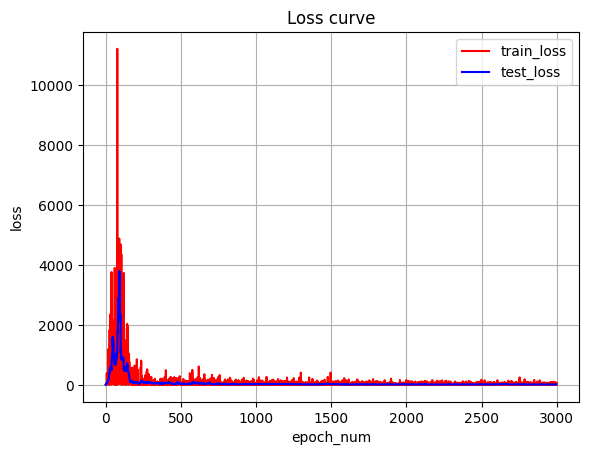

In [34]:
# plot loss

import matplotlib.pyplot as plt
mid_point = 100000
plt.figure()  
x = range(0, epoch_num)
plt.plot(x[:3000], losses[:3000], label='train_loss', color='red')
plt.plot(x[:3000], test_losses[:3000], label = 'test_loss', color='blue')   
plt.title('Loss curve')
plt.xlabel('epoch_num')
plt.ylabel('loss')
plt.legend()
plt.grid(True)
plt.show() 

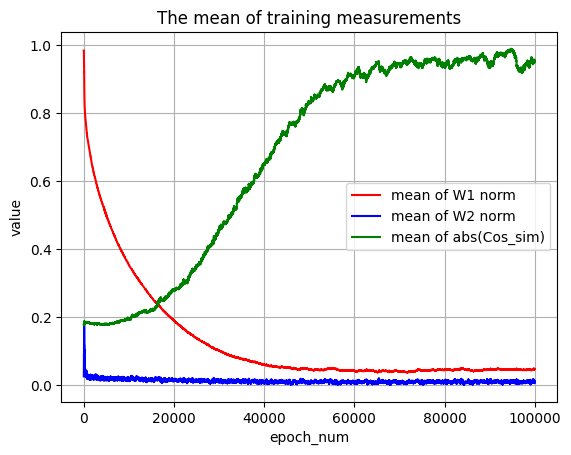

In [36]:
import matplotlib.pyplot as plt
plt.figure()  
x = range(0, epoch_num)
plt.plot(x, W1_norm_means, label='mean of W1 norm', color='red')
plt.plot(x, W2_norm_means, label='mean of W2 norm', color='blue')
plt.plot(x, Cos_sim_abs_means, label='mean of abs(Cos_sim)', color='green')
plt.title('The mean of training measurements')
plt.xlabel('epoch_num')
plt.ylabel('value')
plt.legend()
plt.grid(True)
plt.show() 

In [23]:
for i in range(len(W1_norm_means) - 1):
     if i % 5000 != 0 and i != 1250: 
          continue
     print(i, W1_norm_means[i], -W1_norm_means[i+5000]+W1_norm_means[i])

0 0.9848371744155884 0.48633837699890137
1250 0.6905449628829956 0.23432877659797668
5000 0.498498797416687 0.1450221836566925
10000 0.3534766137599945 0.09603956341743469
15000 0.2574370503425598 0.06852276623249054
20000 0.18891428411006927 0.05133584141731262
25000 0.13757844269275665 0.03675040602684021
30000 0.10082803666591644 0.024746224284172058
35000 0.07608181238174438 0.01716872677206993
40000 0.058913085609674454 0.008375808596611023
45000 0.05053727701306343 0.0052421726286411285
50000 0.0452951043844223 -0.0030617080628871918
55000 0.048356812447309494 0.007105119526386261
60000 0.04125169292092323 0.0037881359457969666
65000 0.037463556975126266 -0.0017435960471630096
70000 0.039207153022289276 -0.0038403868675231934
75000 0.04304753988981247 -0.0008594729006290436
80000 0.04390701279044151 0.0004863552749156952
85000 0.04342065751552582 -0.0006891041994094849
90000 0.0441097617149353 -0.0006913617253303528
95000 0.044801123440265656 -0.0013450831174850464


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


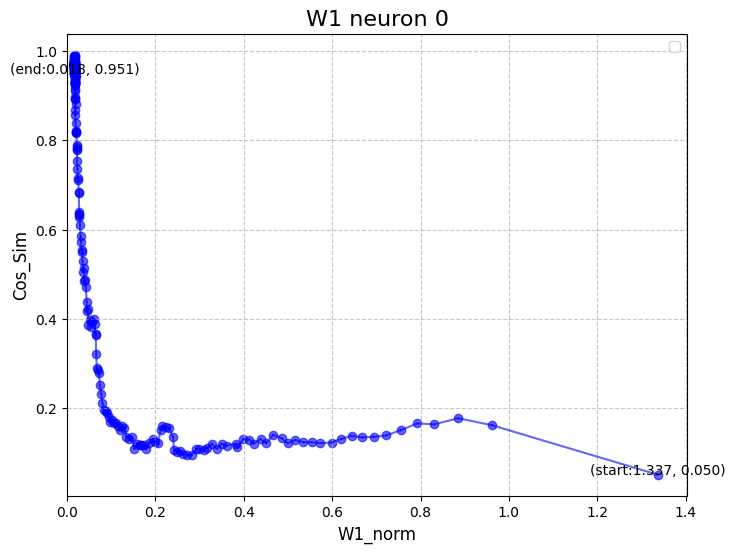

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


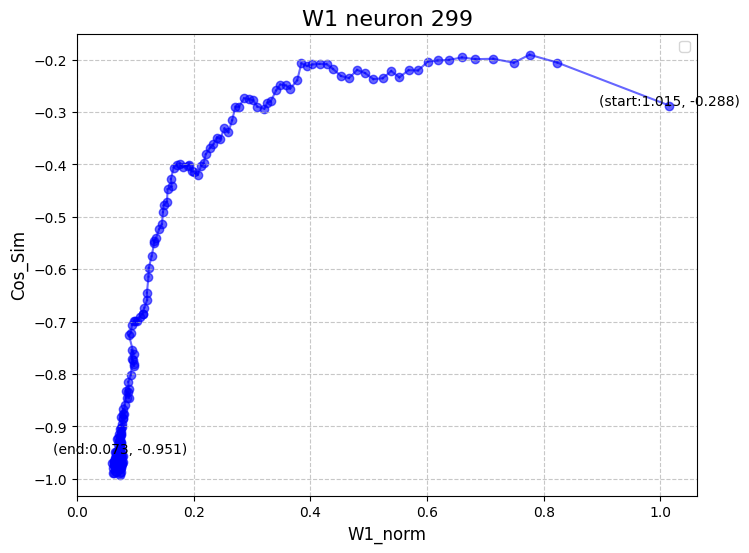

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


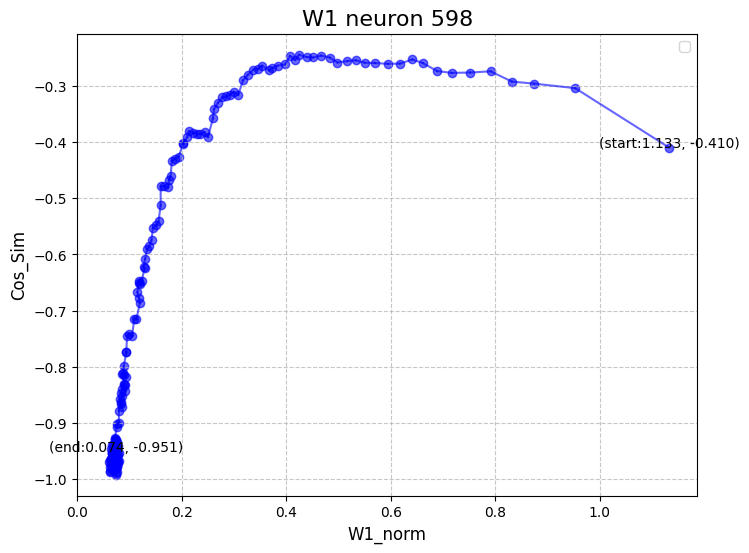

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


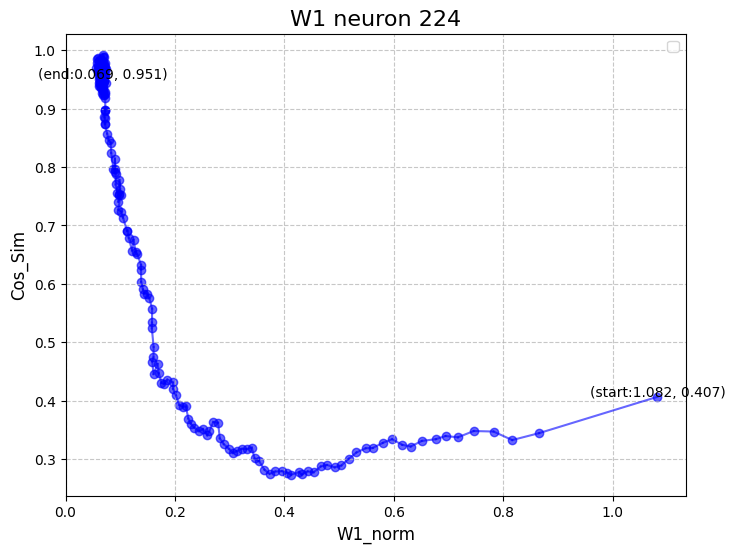

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


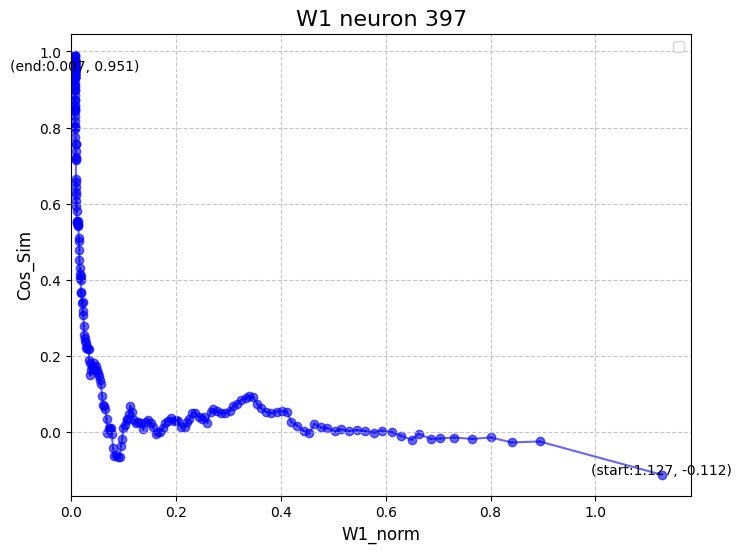

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


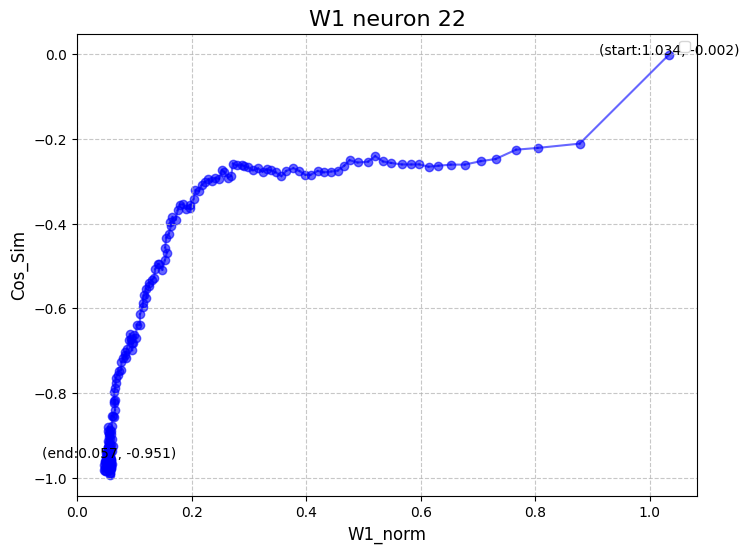

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


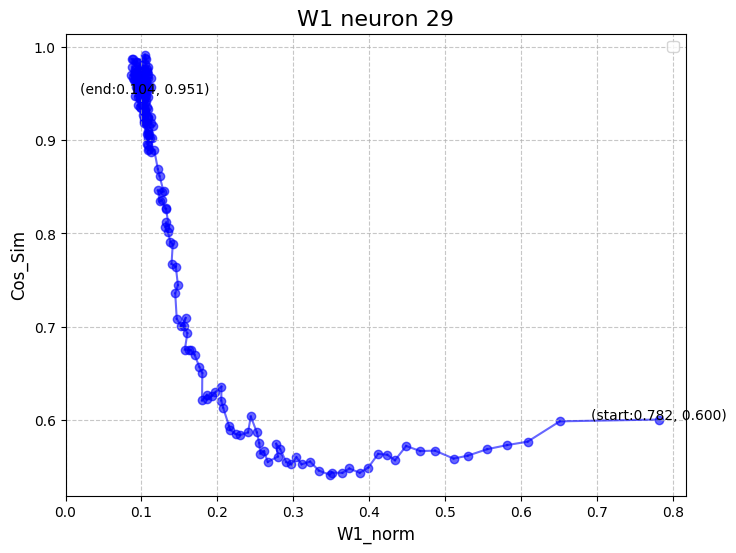

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


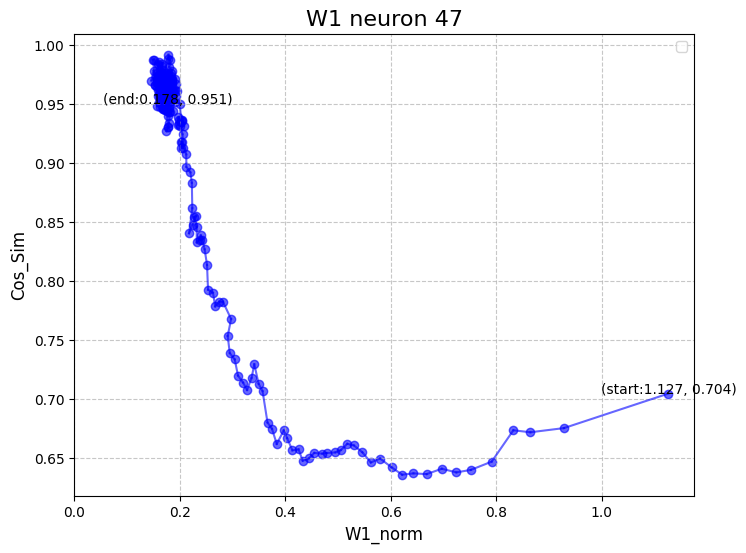

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


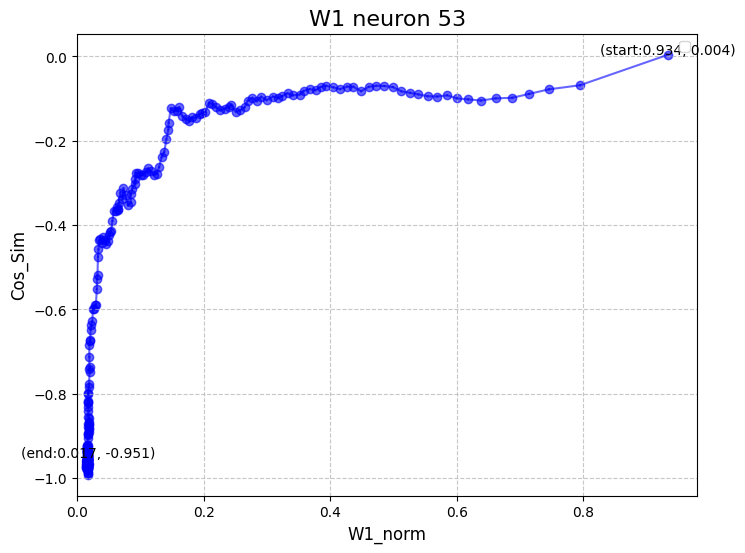

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


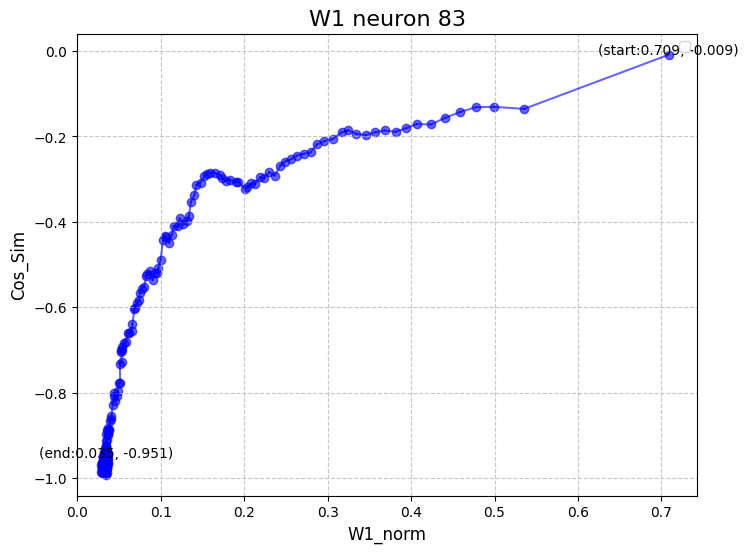

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


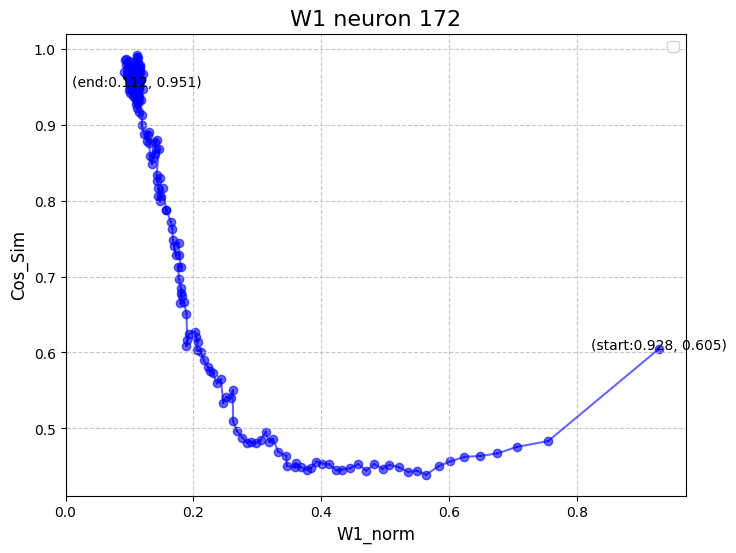

In [24]:
# norm and alignment corresponding to the neuron

for i in range(Spec_neuron_check_num):
     plt.figure(figsize=(8, 6))
     for j in range(1,check_num):
          plt.plot([W1_norm_list[j][W2_check_pos[i]],W1_norm_list[j - 1][W2_check_pos[i]]], [W1_cos_list[j][W2_check_pos[i]],W1_cos_list[j - 1][W2_check_pos[i]]],linestyle='-',  color='b', alpha=0.6)
     for j in range(check_num):
          plt.scatter(W1_norm_list[j][W2_check_pos[i]], W1_cos_list[j][W2_check_pos[i]], color='b', alpha=0.6)
     plt.annotate(f'(start:{W1_norm_list[0][W2_check_pos[i]]:.3f}, {W1_cos_list[0][W2_check_pos[i]]:.3f})',  
                 (W1_norm_list[0][W2_check_pos[i]], W1_cos_list[0][W2_check_pos[i]]),  
                 textcoords="offset points",     
                 xytext=(0, 0),        
                 ha='center',)   
     plt.annotate(f'(end:{W1_norm_list[check_num - 1][W2_check_pos[i]]:.3f}, {W1_cos_list[check_num - 1][W2_check_pos[i]]:.3f})',  
                 (W1_norm_list[check_num - 1][W2_check_pos[i]], W1_cos_list[check_num - 1][W2_check_pos[i]]),  
                 textcoords="offset points",     
                 xytext=(0, 0),        
                 ha='center',)  
     plt.title(f'W1 neuron {W2_check_pos[i]}', fontsize=16)
     plt.xlabel('W1_norm', fontsize=12)
     plt.ylabel('Cos_Sim', fontsize=12)

     plt.grid(True, linestyle='--', alpha=0.7)
     plt.xlim(0, )
     plt.legend()
     plt.show()

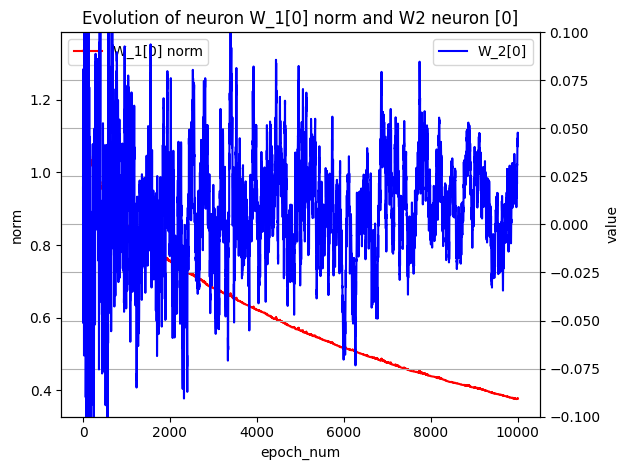

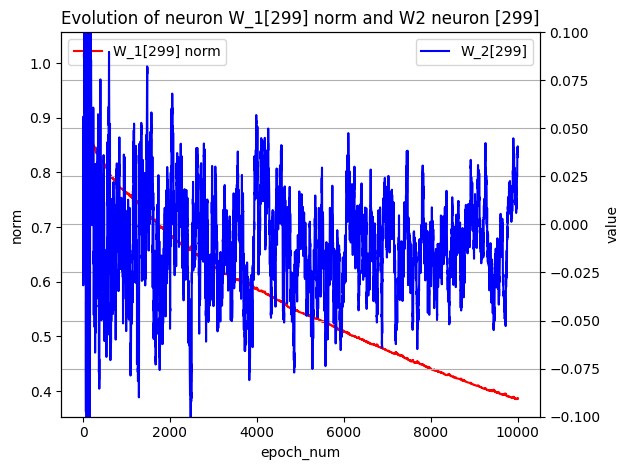

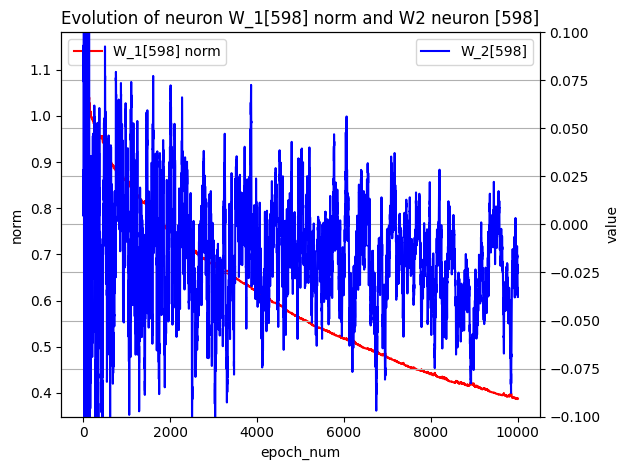

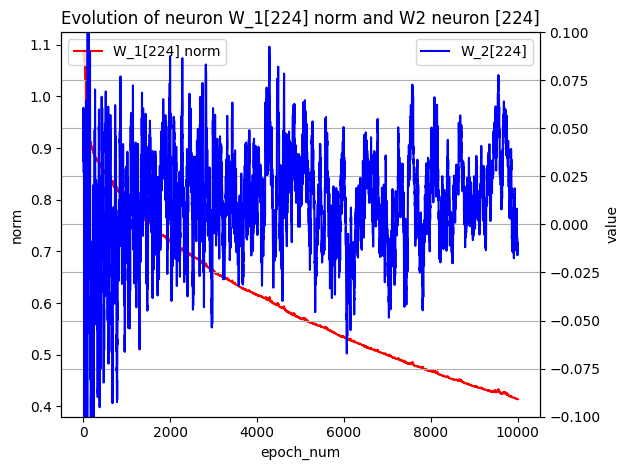

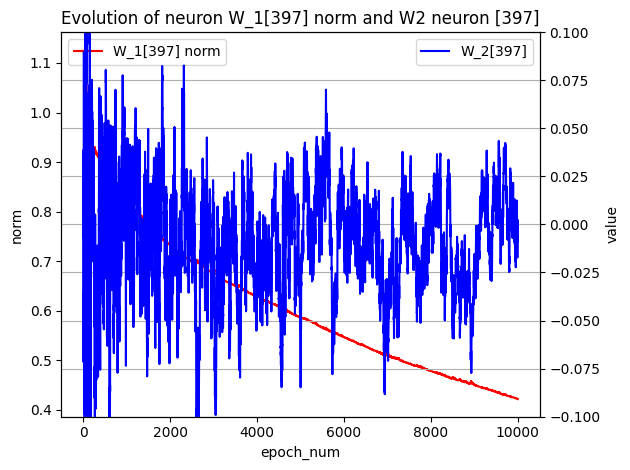

...

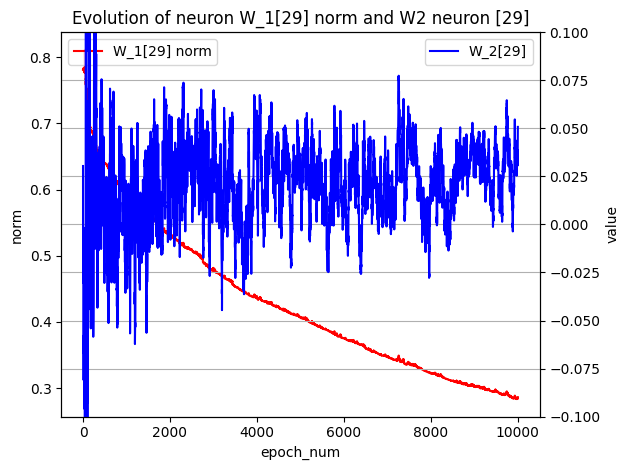

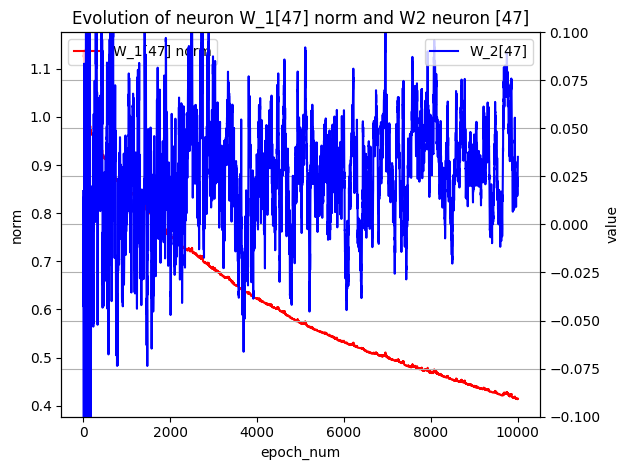

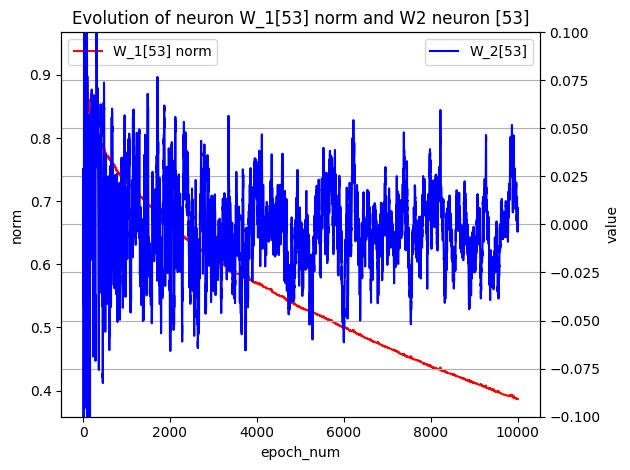

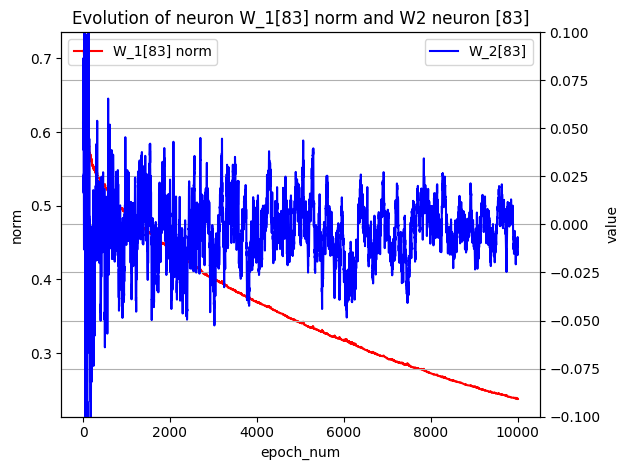

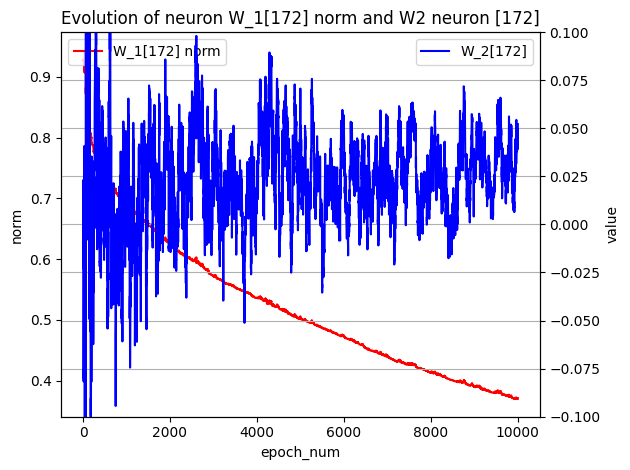

In [25]:
# Seperate norm corresponding to the neuron

x = range(0, epoch_num + 1)
for i in range(Spec_neuron_check_num):
     fig, ax1 = plt.subplots()
     ax1.plot(x[:10001], W1_spec_norm[i][:10001], label=f'W_1[{W1_check_pos[i]}] norm', color='red')
     ax1.annotate(f'({x[epoch_num - 1]}, {W1_spec_norm[i][epoch_num - 1]:.3f})',  
                 (x[epoch_num - 1], W1_spec_norm[i][epoch_num - 1]),  
                 textcoords="offset points",     
                 xytext=(5, 5),        
                 ha='center',)   
     ax1.set_title(f'Evolution of neuron W_1[{W1_check_pos[i]}] norm and W2 neuron [{W2_check_pos[i]}]')
     ax1.set_xlabel('epoch_num')
     ax1.set_ylabel('norm')
     ax1.legend(loc="upper left")

   
     ax2 = ax1.twinx()
     ax2.plot(x[:10001], W2_check_list[i][:10001], label=f'W_2[{W2_check_pos[i]}]', color='blue')
     ax2.annotate(f'({x[epoch_num - 1]}, {W2_check_list[i][epoch_num - 1]:.3f})',  
                 (x[epoch_num - 1], W2_check_list[i][epoch_num - 1]),  
                 textcoords="offset points",     
                 xytext=(5, 5),        
                 ha='center',)   
     ax2.set_xlabel('epoch_num')
     ax2.set_ylabel('value')
     ax2.legend(loc="upper right")
     ax2.grid(True)
     ax2.set_ylim(-0.1,0.1)


     # for ax in (ax1, ax2):
     #      ax.axvline(x=40000, color='green', linestyle='--', linewidth=1)

     fig.tight_layout() 
     plt.show()


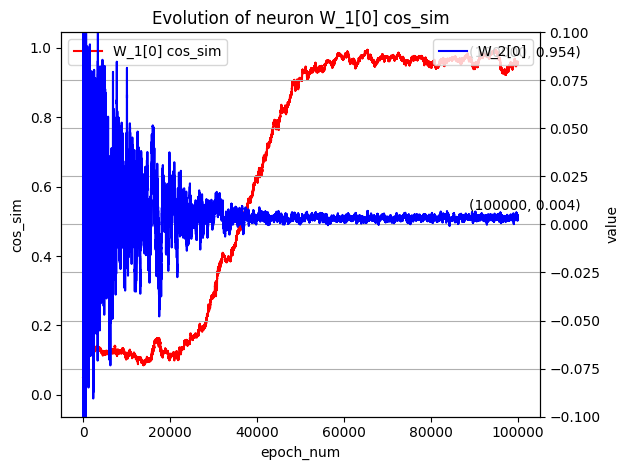

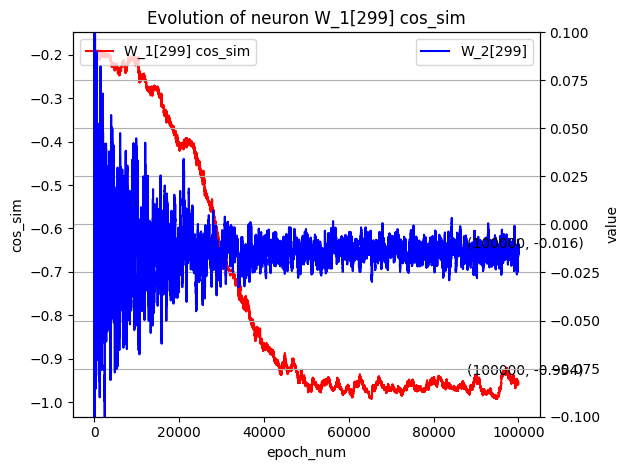

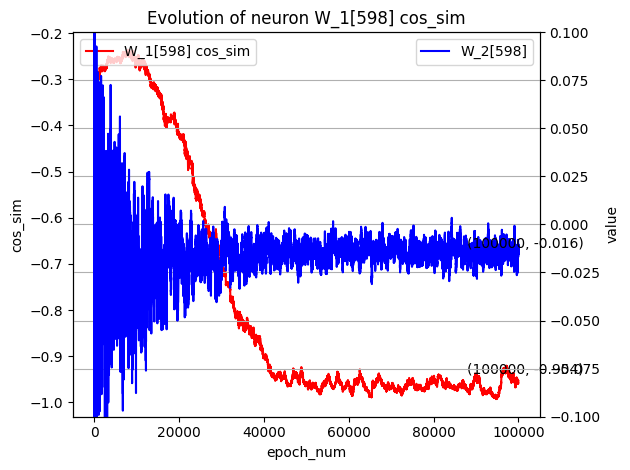

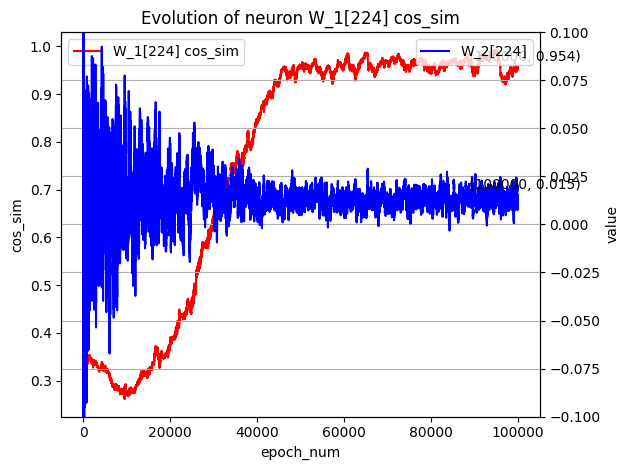

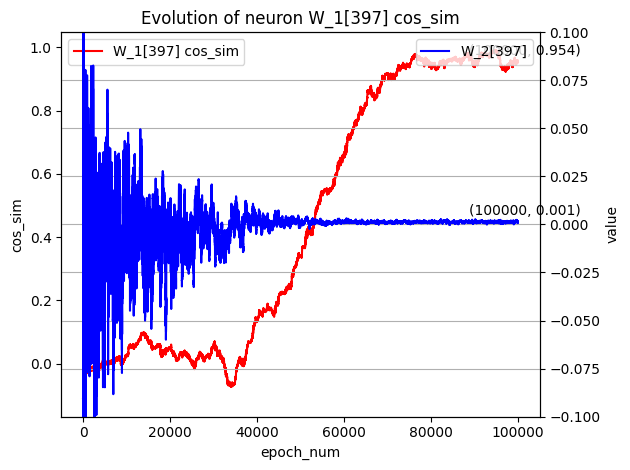

...

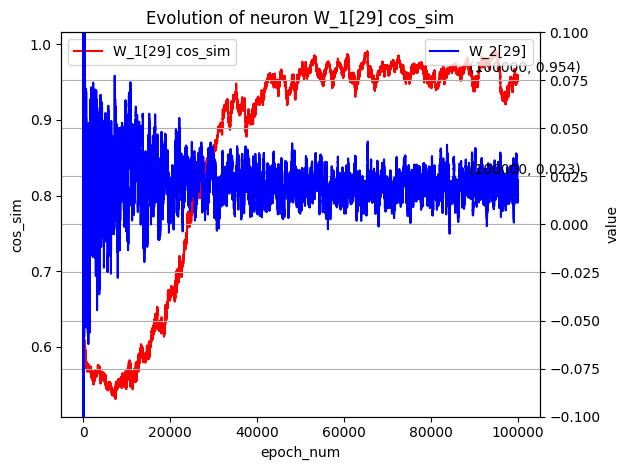

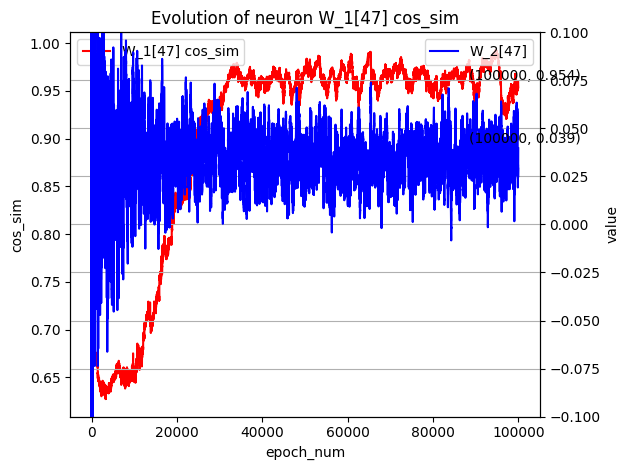

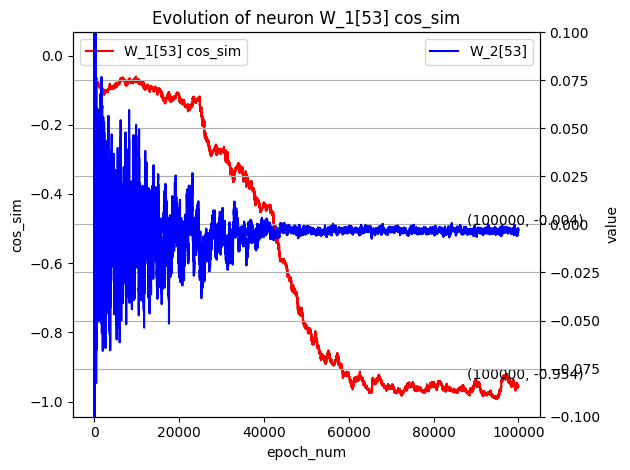

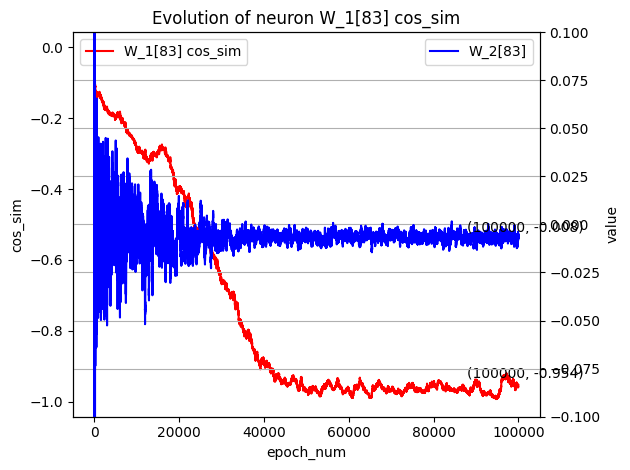

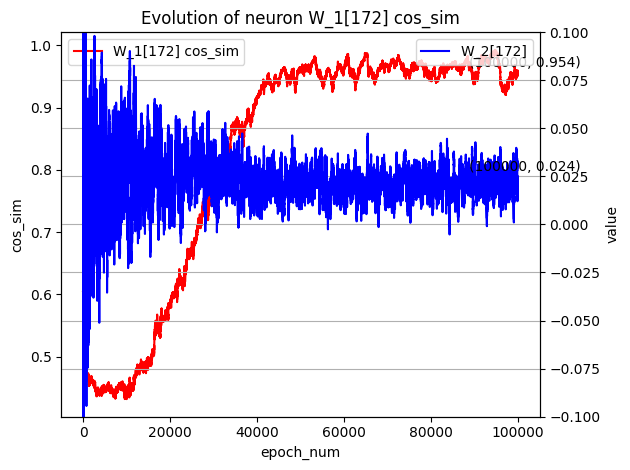

In [26]:
# Cos_sim corresponding to the neuron

x = range(0, epoch_num + 1)
for i in range(Spec_neuron_check_num):
     fig, ax1 = plt.subplots()
     ax1.plot(x, W1_spec_cossim[i], label=f'W_1[{W1_check_pos[i]}] cos_sim', color='red')
     ax1.annotate(f'({x[epoch_num - 1]}, {W1_spec_cossim[i][epoch_num - 1]:.3f})',  
                 (x[epoch_num - 1], W1_spec_cossim[i][epoch_num - 1]),  
                 textcoords="offset points",     
                 xytext=(5, 5),        
                 ha='center',)   
     ax1.set_title(f'Evolution of neuron W_1[{W1_check_pos[i]}] cos_sim')
     ax1.set_xlabel('epoch_num')
     ax1.set_ylabel('cos_sim')
     ax1.legend(loc="upper left")


     ax2 = ax1.twinx()
     ax2.plot(x, W2_check_list[i], label=f'W_2[{W2_check_pos[i]}]', color='blue')
     ax2.annotate(f'({x[epoch_num - 1]}, {W2_check_list[i][epoch_num - 1]:.3f})',  
                 (x[epoch_num - 1], W2_check_list[i][epoch_num - 1]),  
                 textcoords="offset points",     
                 xytext=(5, 5),        
                 ha='center',)   
     ax2.set_xlabel('epoch_num')
     ax2.set_ylabel('value')
     ax2.legend(loc="upper right")
     ax2.grid(True)
     ax2.set_ylim(-0.1,0.1)


     fig.tight_layout() 
     plt.show() 

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


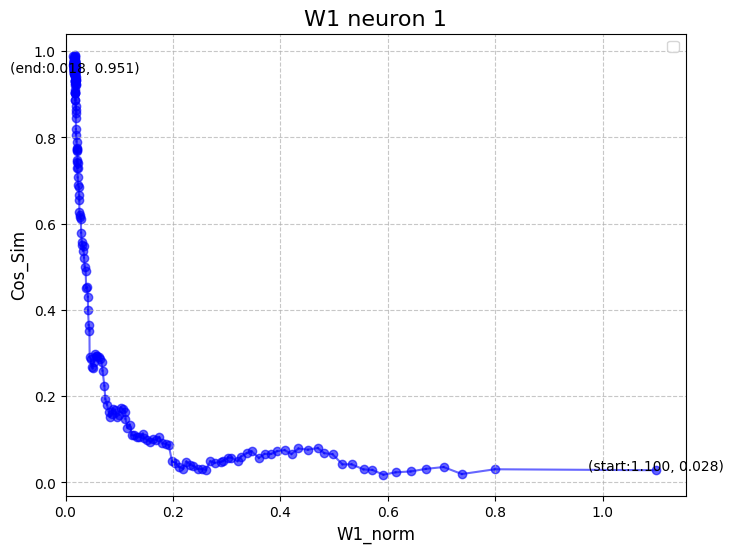

In [28]:
# norm and alignment corresponding to certain neuron
valid_point = 1
plt.figure(figsize=(8, 6))
for j in range(1,check_num):
     plt.plot([W1_norm_list[j][valid_point],W1_norm_list[j - 1][valid_point]], [W1_cos_list[j][valid_point],W1_cos_list[j - 1][valid_point]],linestyle='-',  color='b', alpha=0.6)
for j in range(check_num):
     plt.scatter(W1_norm_list[j][valid_point], W1_cos_list[j][valid_point], color='b', alpha=0.6)
plt.annotate(f'(start:{W1_norm_list[0][valid_point]:.3f}, {W1_cos_list[0][valid_point]:.3f})',  
               (W1_norm_list[0][valid_point], W1_cos_list[0][valid_point]),  
               textcoords="offset points",     
               xytext=(0, 0),        
               ha='center',)   
plt.annotate(f'(end:{W1_norm_list[check_num - 1][valid_point]:.3f}, {W1_cos_list[check_num - 1][valid_point]:.3f})',  
               (W1_norm_list[check_num - 1][valid_point], W1_cos_list[check_num - 1][valid_point]),  
               textcoords="offset points",     
               xytext=(0, 0),        
               ha='center',)  
plt.title(f'W1 neuron {valid_point}', fontsize=16)
plt.xlabel('W1_norm', fontsize=12)
plt.ylabel('Cos_Sim', fontsize=12)

plt.grid(True, linestyle='--', alpha=0.7)
plt.xlim(0, )
plt.legend()
plt.show()

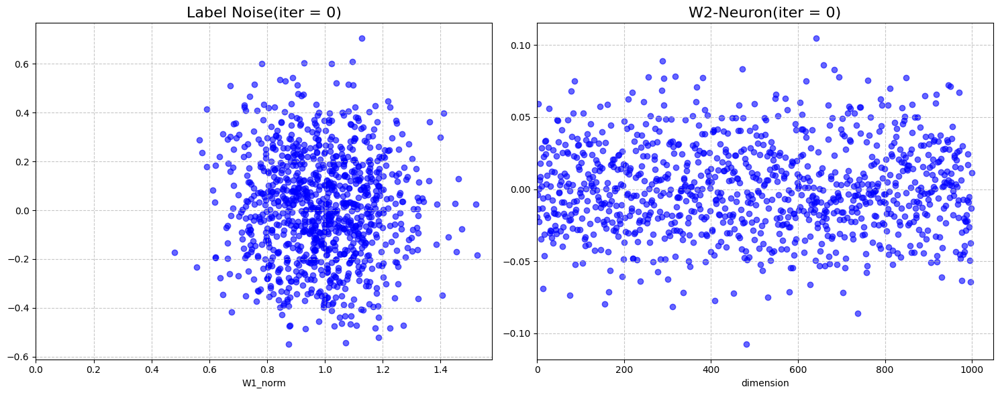

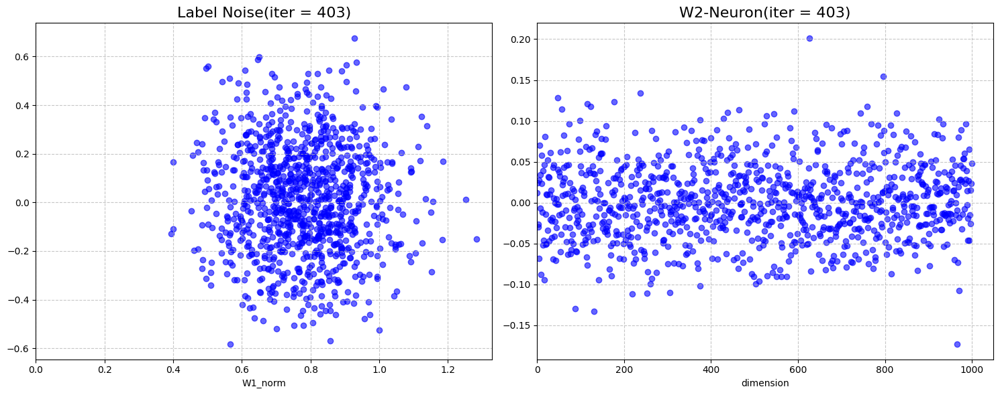

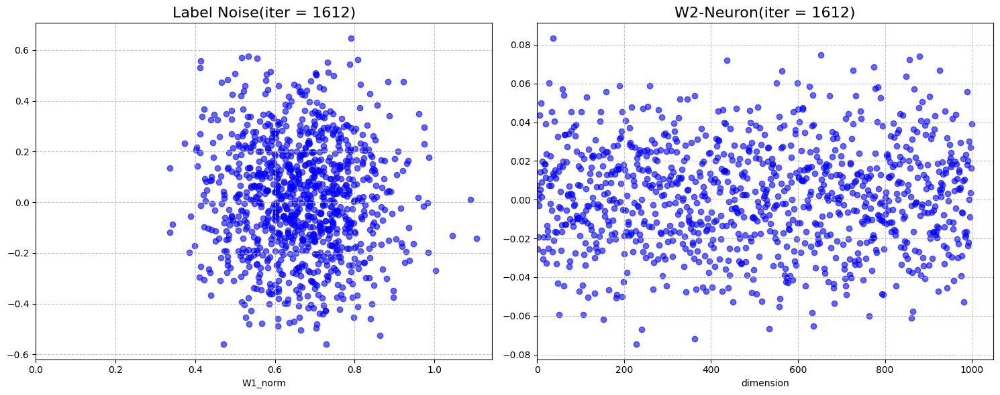

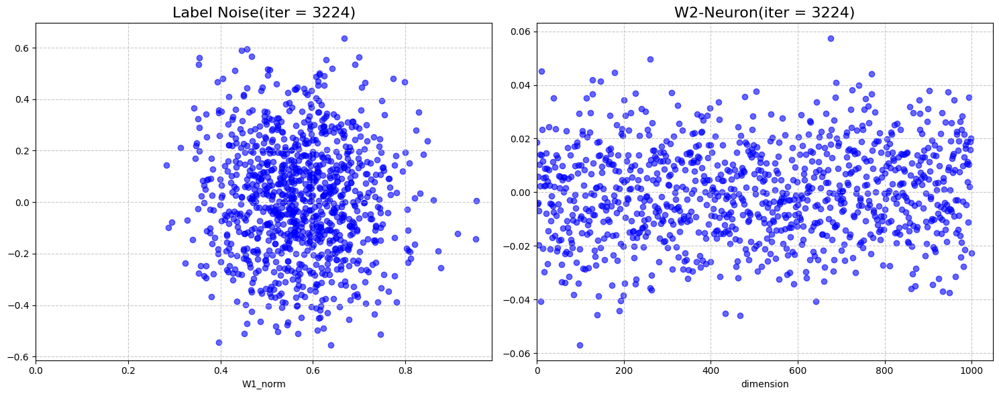

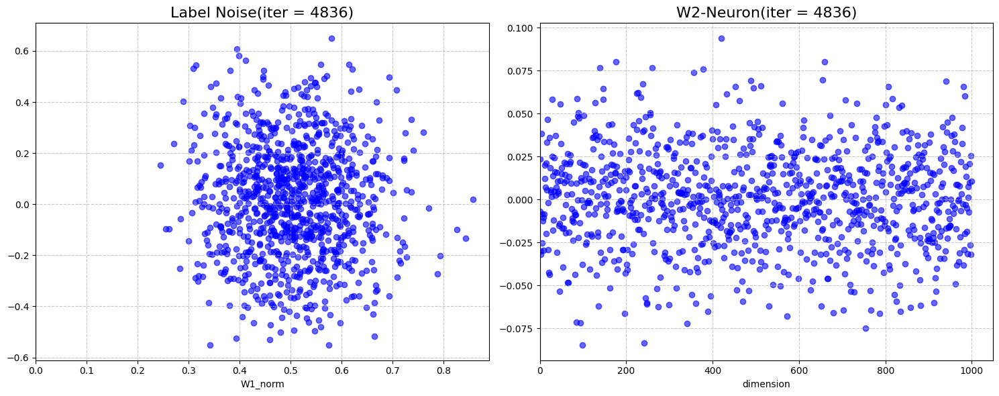

...

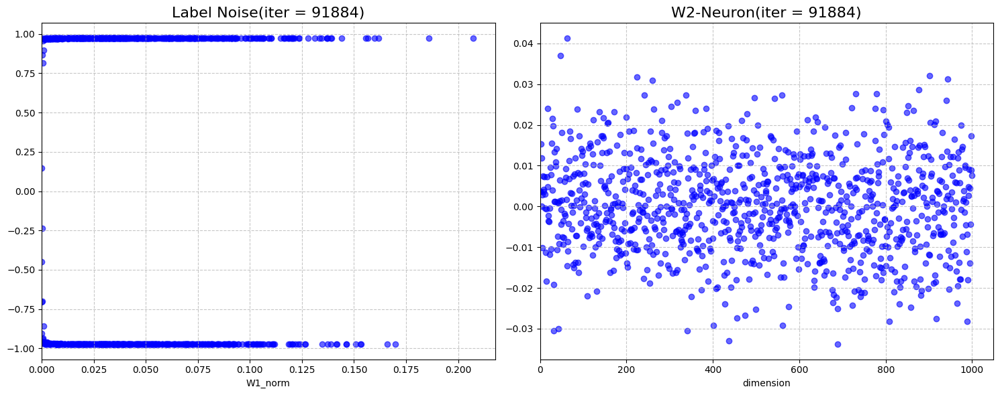

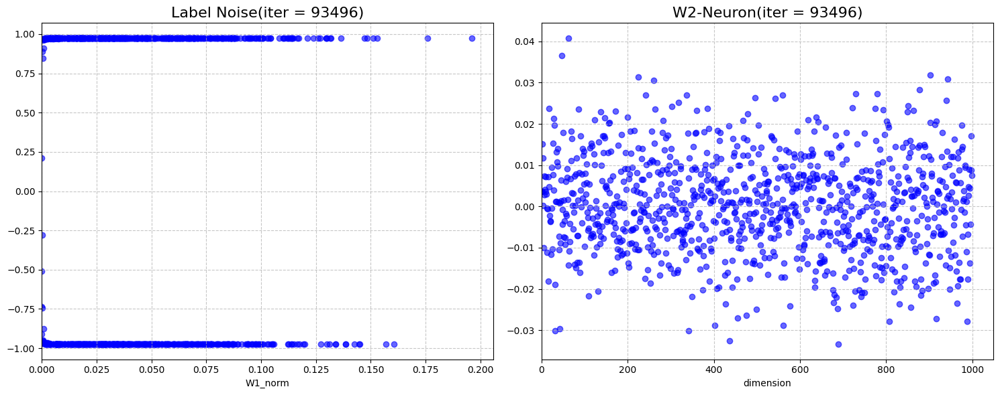

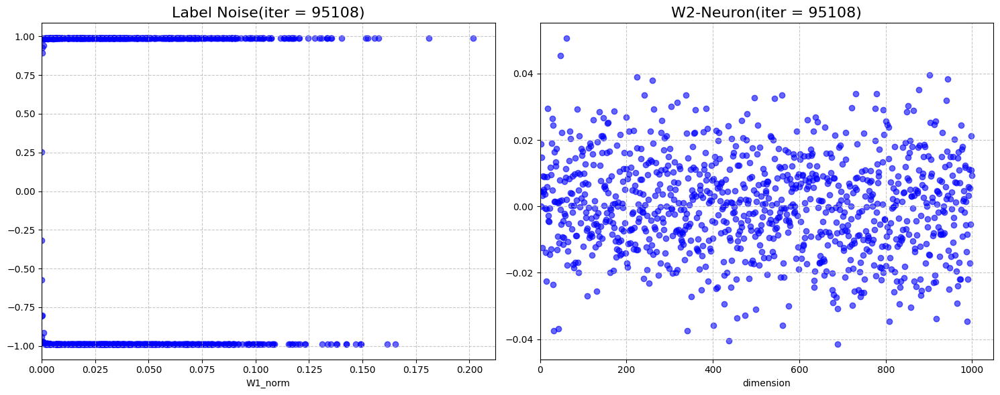

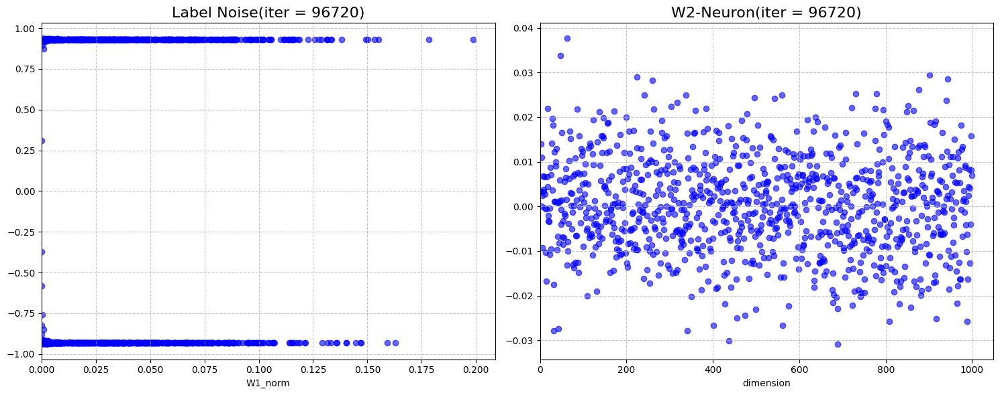

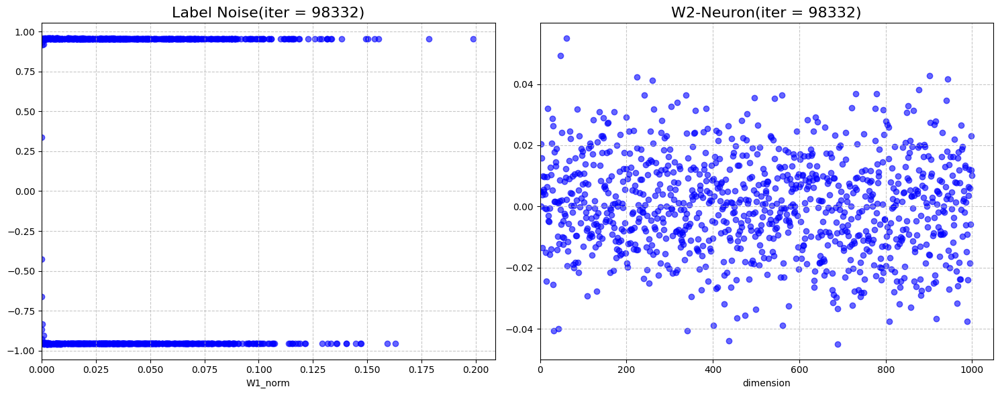

In [31]:
# compare norm alignment with W2

for i in range(check_num):
     if i % 4 != 0 and i != 1:
          continue
     fig, axes = plt.subplots(1, 2, figsize = (15,6))  # 1行2列的子图
     axes[0].scatter(W1_norm_list[i], W1_cos_list[i], color='b', alpha=0.6)
     axes[0].set_title(f'Label Noise(iter = {check_pos[i]})',fontsize=16)
     axes[0].grid(True, linestyle='--', alpha=0.7)
     axes[0].set_xlim(left=0)
     axes[0].set_xlabel("W1_norm")


     axes[1].scatter(W2_x, W2_list[i], color='b', alpha=0.6)
     axes[1].set_title(f'W2-Neuron(iter = {check_pos[i]})', fontsize=16)
     axes[1].grid(True, linestyle='--', alpha=0.7)
     axes[1].set_xlim(left=0)
     axes[1].set_xlabel("dimension")

     plt.tight_layout()
     plt.show()